In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import random
import pymc as pm
import arviz as az

from math import log10, floor

useratiodata=1 #1 for Scenario B to incorporate ratio data, 0 otherwise
sigmadeterministic=1 #0 to assign Inverse Gamma prior on variance of noise variables, otherwise plug in estimates will be used. 

In [2]:
dataflows = pd.read_csv("Aggregate_Flow_Simple_V8.txt",comment='#')
datastocks = pd.read_csv("Aggregate_Stock_Simple_V8.txt",comment='#')

scale=1.0 #1000.0

#sigmastd=0.1 #0.01 #3.0

datastocks['quantity']=datastocks['quantity']/scale
dataflows['quantity']=dataflows['quantity']/scale

from preprocessingagg import preprocessing, createdesignmatrix, createratiomatrix, createcompactmatrix, createcompactratiomatrix
from prior import round_to_poweroften, definepriors
from model import mfamodel
from posteriorpredictive import filelabeler, ppplots, ppplotsratiodata, top10hdi

availabledatafull, dataparentstockneededcols, dataparentflowsneededcols, processnamesdict, allflownumbersmatrix, m, N, massconservedindices=preprocessing(datastocks,dataflows)

print('check mass conserved indices')
print(massconservedindices)

#construct the prior

dataflowspriors = pd.read_csv("Aggregate_Flow_Prior_Simple_V8.txt",comment='#')
datastockspriors = pd.read_csv("Aggregate_Stock_Prior_Simple_V8.txt",comment='#')

#compact prior code from aluminium code
#priormean,covariancevec,truevalues=definepriors(datastockspriors, dataflowspriors, availabledatafull, m, N)

#non compact code

#priormean = np.array([dataavg] * N)
priormean = np.array([1000.0] * N)/scale
#covariancevec = (dataavg**2)  * np.ones(N)
covariancevec = 10000000.0  * np.ones(N)/scale**2 #100000.0  * np.ones(N)/scale

dataflowspriors['quantity']=dataflowspriors['quantity']/scale
datastockspriors['quantity']=datastockspriors['quantity']/scale


dataflowspriorchild=dataflowspriors.loc[(dataflowspriors['ParentProcessFlowfrom'] == 0) & (dataflowspriors['ParentProcessFlowto'] == 0)]
dataflowspriorfromparent=dataflowspriors.loc[(dataflowspriors['ParentProcessFlowfrom'] == 1) & (dataflowspriors['ParentProcessFlowto'] == 0)]
dataflowspriortoparent=dataflowspriors.loc[(dataflowspriors['ParentProcessFlowfrom'] == 0) & (dataflowspriors['ParentProcessFlowto'] == 1)]
dataflowspriorparent=dataflowspriors.loc[(dataflowspriors['ParentProcessFlowfrom'] == 1) & (dataflowspriors['ParentProcessFlowto'] == 1)]


datastockspriorsparent=datastockspriors.loc[datastockspriors['ParentProcess'] == 1]

datastockspriorschild=datastockspriors.loc[datastockspriors['ParentProcess'] == 0]


datastockspriorschild=datastockspriorschild[['Processnumber', 'quantity']]
print(datastockspriorschild)
datastockspriorschild=datastockspriorschild.to_numpy()
print(datastockspriorschild)

dataflowspriorchild = dataflowspriorchild[['Flownumberfrom', 'Flownumberto','quantity']]
dataflowspriorchild["Flownumber"] = m + (dataflowspriorchild["Flownumberfrom"]) * m + dataflowspriorchild["Flownumberto"]
print(dataflowspriorchild)
dataflowspriorchild = dataflowspriorchild[['Flownumber','quantity']].to_numpy()
print(dataflowspriorchild)

#priormean[0]=-37.2
#priormean[1]=9.8

datastockspriorsparent=datastockspriorsparent.to_numpy()
dataflowspriorfromparent=dataflowspriorfromparent.to_numpy()
dataflowspriortoparent=dataflowspriortoparent.to_numpy()
dataflowspriorparent=dataflowspriorparent.to_numpy()

print('datastockpriorsparent')
for row in datastockspriorsparent:
    print(row)
    subprocesses = row[7].split("-")
    subprocesses = list(map(int, subprocesses))
    subprocesses.sort()
    print(subprocesses)
    print(row[1]/len(subprocesses))
    for i in subprocesses:
        priormean[i] = max(row[1] / (scale*len(subprocesses)),100.0/scale) #max(row[1] / (scale*len(subprocesses)),0.0/scale)
        covariancevec[i] = 10*np.copy(priormean[i])**2 #max(0.75*row[1] / (scale*len(subprocesses)),1000.0/scale) #min(0.75*row[1],500)  / len(subprocesses)
        #covariancevec[i] = 0.1

print('dataflowspriortoparent')
for row in dataflowspriortoparent:
    print(row)
    print(row[2])
    print(row[5])
    print(row[10])

    subprocesses = row[10].split("-")
    subprocesses = list(map(int, subprocesses))
    subprocesses.sort()
    print(subprocesses)
    print(row[2]/len(subprocesses))
    for subprocess in subprocesses:
        priormean[m + (row[5]) * m + subprocess]=max(row[2]/(scale*len(subprocesses)),100.0/scale) #max(row[2]/(scale*len(subprocesses)),0.0/scale)
        covariancevec[m + (row[5]) * m + subprocess] = 10*np.copy(priormean[m + (row[5]) * m + subprocess])**2 #max(row[1] / (scale*len(subprocesses)),100.0**2) #100.0 #max(0.75*row[2]/(scale*len(subprocesses)),1000.0/scale)  #min(0.75*row[2],500)/len(subprocesses)
        #covariancevec[m + (row[5]) * m + subprocess] = 0.1
        

print('dataflowspriorfromparent')
for row in dataflowspriorfromparent:
    print(row)
    print(row[2])
    print(row[6])
    print(row[9])

    subprocesses = row[9].split("-")
    subprocesses = list(map(int, subprocesses))
    subprocesses.sort()
    print(subprocesses)
    print(row[2] / len(subprocesses))
    for subprocess in subprocesses:
        priormean[m + (subprocess) * m + row[6]] = max(row[2] / (scale*len(subprocesses)),100.0/scale)
        covariancevec[m + (subprocess) * m + row[6]] = 10*np.copy(priormean[m + (subprocess) * m + row[6]])**2 #100.0 #max(0.75*row[2]/(scale*len(subprocesses)),1000.0/scale)

print('dataflowspriorparent')
for row in dataflowspriorparent:
    print(row)
    print(row[2])
    print(row[6])
    print(row[9])

    subprocessesfrom = row[9].split("-")
    subprocessesfrom = list(map(int, subprocessesfrom))
    subprocessesfrom.sort()
    
    subprocessesto = row[10].split("-")
    subprocessesto = list(map(int, subprocessesto))
    subprocessesto.sort()
    
    print(subprocessesfrom)
    print(subprocessesto)
    print( row[2] / (len(subprocessesfrom)*len(subprocessesto)))
    for subprocessfrom in subprocessesfrom:
        for subprocessto in subprocessesto:
            priormean[m + (subprocessfrom) * m + subprocessto] = max(row[2] / (scale*len(subprocessesfrom)*len(subprocessesto)),0.0/scale)
            covariancevec[m + (subprocessfrom) * m + subprocessto] = 10*np.copy(priormean[m + (subprocessfrom) * m + subprocessto])**2 #max(0.75*row[2] / (scale*len(subprocessesfrom)*len(subprocessesto)),1000.0/scale)
            
   
            

#moved child updates to last so any prior information on the disaggregated level overrides prior information on the top level            
            
#priormean = np.array([10] * N)
#covariancevec = 3 ** 2 * np.ones(N)
for row in datastockspriorschild:
    priormean[int(row[0])]=row[1]
    covariancevec[int(row[0])]=4*np.copy(priormean[int(row[0])])**2 #min(0.75*row[1],1000)
    #covariancevec[int(row[0])]=10*np.copy(priormean[int(row[0])])**2 #min(0.75*row[1],1000)


for row in dataflowspriorchild:
    if row[1]==0: #priors can't be exactly 0 as that's on the boundary of the support, which causes pymc3 to fail
        priormean[int(row[0])]=row[1]+0.1
        covariancevec[int(row[0])]=0.01
    else:
        priormean[int(row[0])] = row[1]
        #covariancevec[int(row[0])]=10*np.copy(priormean[int(row[0])])**2 #min(0.75*row[1],1000)
        covariancevec[int(row[0])]=4*np.copy(priormean[int(row[0])])**2 #min(0.75*row[1],1000)
        
            
#priormeancompact = priormean[availablechildstocksandflows]
#covarianceveccompact = covariancevec[availablechildstocksandflows]
#priorcovariancecompact = np.diag(covarianceveccompact)


#construct design matrix

designmatrix,datavector,availablechildstocksandflows,zerostocksandflows,stockindex,flowindex,CoMindex=createdesignmatrix(availabledatafull, dataparentstockneededcols, dataparentflowsneededcols, m, N, massconservedindices)

print('check stock index')
print(stockindex)
print('check flow index')
print(flowindex)
print('check CoM index')
print(CoMindex)

print(datavector)

#construct matrices for flow ratio data

dataratios = pd.read_csv("Aggregate_Flow_Ratio.txt",comment='#')
ratiovector,ratiomatrixtop,ratiomatrixbottom,availablechildstocksandflows=createratiomatrix(dataratios, m, N, availablechildstocksandflows)

print('ratiovector')
print(ratiovector)

#set function assures uniqueness of the variables selected
availablechildstocksandflows=sorted(list(set(availablechildstocksandflows)))

zerostocksandflows=sorted(list(set(zerostocksandflows)))

availablechildstocksandflows = [x for x in availablechildstocksandflows if x not in zerostocksandflows]


availablechildstocks = [i for i in availablechildstocksandflows if i < m]
availablechildflows = [i for i in availablechildstocksandflows if i >= m]

availablechildstocksnames=[processnamesdict[str(x)] for x in availablechildstocks]

#subset of designmatrix for stocks and flows which actually exist in the system/are non zero.
designmatrixcompact,designmatrixstockscompact,designmatrixflowscompact=createcompactmatrix(designmatrix,availablechildstocksandflows,m)

ratiomatrixtopstockscompact,ratiomatrixtopflowscompact,ratiomatrixbottomstockscompact,ratiomatrixbottomflowscompact=createcompactratiomatrix(ratiomatrixtop,ratiomatrixbottom,availablechildstocksandflows,m)

priormeancompact = priormean[availablechildstocksandflows]
covarianceveccompact = covariancevec[availablechildstocksandflows]
priorcovariancecompact = np.diag(covarianceveccompact)

print('check min')

print(np.min(priormeancompact))


#truevaluescompact=truevalues[availablechildstocksandflows]   

check mass conserved indices
[2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41]
    Processnumber  quantity
2              21    1812.0
3              22    2718.0
4              23    8470.0
6              24     136.5
8              26    1687.0
9              27    2530.0
10             28    7885.0
13             29    5371.0
14             30    8057.0
15             31   25111.0
17             32   36000.0
18             33    4000.0
21             37   14250.0
22             38     750.0
24             39     250.0
25             40     250.0
26             41    4500.0
[[2.1000e+01 1.8120e+03]
 [2.2000e+01 2.7180e+03]
 [2.3000e+01 8.4700e+03]
 [2.4000e+01 1.3650e+02]
 [2.6000e+01 1.6870e+03]
 [2.7000e+01 2.5300e+03]
 [2.8000e+01 7.8850e+03]
 [2.9000e+01 5.3710e+03]
 [3.0000e+01 8.0570e+03]
 [3.1000e+01 2.5111e+04]
 [3.2000e+01 3.6000e+04]
 [3.3000e+01 4.0000e+03]
 [3.7000e+01 1

In [3]:
#check mass balance of input data.

priormeantest = np.array([0.0] * N)

for row in datastockspriorschild:
    priormeantest[int(row[0])]=row[1]

for row in dataflowspriorchild:
    priormeantest[int(row[0])] = row[1]



for j in range(0,m):
    checkindex = j
    flowout = 0
    flowin = 0
    for i in range(0, m):
        flowout = flowout + priormeantest[m * (checkindex + 1) + i]
        flowin = flowin + priormeantest[checkindex + (i + 1) * m]

    print('check conservation of mass')
    print(checkindex)
    print('change in stock')
    print(priormeantest[checkindex])
    print('flowin - flowout')
    print(flowin - flowout)
    print('flowin')
    print(flowin)
    print('flowout')
    print(flowout)
    print('next')

check conservation of mass
0
change in stock
0.0
flowin - flowout
-136359.0
flowin
0.0
flowout
136359.0
next
check conservation of mass
1
change in stock
0.0
flowin - flowout
-11970.0
flowin
0.0
flowout
11970.0
next
check conservation of mass
2
change in stock
0.0
flowin - flowout
-9832.0
flowin
92239.0
flowout
102071.0
next
check conservation of mass
3
change in stock
0.0
flowin - flowout
-1556.0
flowin
17648.0
flowout
19204.0
next
check conservation of mass
4
change in stock
0.0
flowin - flowout
-2335.0
flowin
26472.0
flowout
28807.0
next
check conservation of mass
5
change in stock
0.0
flowin - flowout
3362.0
flowin
8379.0
flowout
5017.0
next
check conservation of mass
6
change in stock
0.0
flowin - flowout
-3934.0
flowin
3591.0
flowout
7525.0
next
check conservation of mass
7
change in stock
0.0
flowin - flowout
-5492.5
flowin
20948.0
flowout
26440.5
next
check conservation of mass
8
change in stock
0.0
flowin - flowout
14053.5
flowin
31423.0
flowout
17369.5
next
check conservation

In [4]:
np.set_printoptions(threshold=np.inf)

print('m')
print(m)

print('check non zero variables')
print(len(availablechildstocksandflows))
print(availablechildstocksandflows)
print('check if variables are ordered')
print(np.array(availablechildstocksandflows)-np.array(sorted(list(set(availablechildstocksandflows)))))

print('check non zero stocks')
print(len(availablechildstocks))
print(availablechildstocks)
print('check non zero flows')
print(len(availablechildflows))
print(availablechildflows)

print('checkratiomatrices stock, should just be 0 everywhere')

print(ratiomatrixtopstockscompact)
print(ratiomatrixbottomstockscompact)

print('checkratiomatrices flows')
print(ratiomatrixtopflowscompact)
print(ratiomatrixbottomflowscompact)

print('checkones')
checkones = np.where(designmatrix == 1)

print(np.asarray(checkones).T.tolist())

for flows in np.asarray(checkones).T.tolist():
    print(flows[0],datavector[flows[0]],[flows[1]//m-1,flows[1]%m]) 


print('check indices')

print(stockindex)
print(flowindex)
print(CoMindex)

print('check datavectorsplit')

print(datavector[stockindex])
print(datavector[flowindex])
print(datavector[CoMindex])

print('before remove 0 points')
print(sorted(list(set(availablechildstocksandflows))))


print('0 points')
print(zerostocksandflows)

quotient = [[i//m-1,i%m] for i in zerostocksandflows]
#reminder = [i%d for i in zerostocksandflows]
print('quotient 0 data')
print(quotient)

print('after remove 0 points')
print(availablechildstocksandflows)

quotient2 = [[i//m-1,i%m] for i in availablechildstocksandflows]
#reminder = [i%d for i in zerostocksandflows]
print('quotient non 0 data')
print(quotient2)

print('check if you actually selected the right non zero flows/stocks')
#outputdataselected=outputdatachildprocess[outputdatachildprocess.index.isin(availablechildstocksandflows)]
#print(outputdataselected[['Flownumber','From','To','quantity']])

print('check stocks and flow indices')
print(availablechildstocksandflows)
print(availablechildstocks)
print(availablechildflows)
print('availablestocksbaselevelnames')
print(availablechildstocksnames)

print('print designmatrixcompact')
print(designmatrixcompact.shape)
print(datavector)
print('hey')


print('print checknotzero')
checknotzero = np.where(designmatrix != 0)

print(np.asarray(checknotzero).T.tolist())

processnamesdictcheck=processnamesdict
processnamesdictcheck['-1'] = 'Stock'

checknotzeronames=[[i[0],datavector[i[0]],designmatrix[i[0],i[1]],processnamesdictcheck[str(i[1]//m-1)],processnamesdictcheck[str(i[1]%m)]] for i in np.asarray(checknotzero).T.tolist()]

print('print checknotzeronames')
print(checknotzeronames)

#print('checkonescompact')
#checkonescompact = np.where(designmatrixcompact == 1)

#print(np.asarray(checkonescompact).T.tolist())


print('checknotzerocompact')
checknotzerocompact = np.where(designmatrixcompact != 0)

print(np.asarray(checknotzerocompact).T.tolist())

varindex = list(range(0,len(availablechildstocksandflows)))
varflownumber = availablechildstocksandflows
variablesdict = dict(zip(varindex, varflownumber))

print('variablesdict')
print(variablesdict)

print('should be the same as checknotzero')
print([[i[0],variablesdict[i[1]]] for i in np.asarray(checknotzerocompact).T.tolist()])

checknotzeronamescompact=[[i[0],datavector[i[0]],designmatrixcompact[i[0],i[1]],processnamesdictcheck[str(variablesdict[i[1]]//m-1)],processnamesdictcheck[str(variablesdict[i[1]]%m)]] for i in np.asarray(checknotzerocompact).T.tolist()]

print('checknotzeronamescompact')
print(checknotzeronamescompact)

#checks if compact data matches the original in terms of which columns (the corresponding variables) 
#they have non zero values in. they match until there are flows where there are extra 0 variables
#in the original, conservation of mass is an obvious example, see below.
for i in range(0,len(checknotzeronames)):
    if i<len(checknotzeronamescompact):
        print(checknotzeronames[i]==checknotzeronamescompact[i])
    else:
        print('compact ended')
    print(i)
    #row 56 onwards is conservation of mass, which won't match cos in the original design matrix
    #CoM goes from every process to every other process
    #row 54 won't match cos that's semimanufacturing to recycling which has a bunch of zero flows, like sheetandplate to internal refining
    #likewise 55 is manufacturing to recycling
    if i<len(checknotzeronamescompact):
        print(checknotzeronamescompact[i])
    print(checknotzeronames[i])

m
49
check non zero variables
165
[1, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 51, 52, 53, 103, 104, 156, 178, 188, 203, 225, 237, 253, 275, 286, 301, 323, 335, 351, 373, 384, 405, 409, 412, 421, 424, 425, 432, 434, 435, 436, 437, 438, 455, 459, 471, 473, 474, 481, 483, 484, 485, 486, 487, 505, 509, 514, 521, 522, 523, 530, 536, 552, 556, 559, 571, 572, 579, 585, 634, 650, 651, 652, 654, 655, 656, 657, 661, 666, 667, 668, 669, 670, 677, 683, 711, 712, 724, 725, 760, 762, 773, 774, 809, 812, 822, 823, 858, 861, 871, 872, 903, 920, 921, 953, 969, 970, 1003, 1018, 1019, 1055, 1067, 1068, 1113, 1162, 1211, 1260, 1309, 1310, 1358, 1359, 1407, 1408, 1456, 1457, 1776, 1780, 1801, 1824, 2020, 2087, 2088, 2089, 2120, 2124, 2127, 2170, 2174, 2218, 2222, 2225, 2268, 2272, 2318, 2322, 2335, 2362, 2408, 2409]
check if variables are ordered
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 

In [5]:
#check prior means and covariance
#it looks like you manually copy and pasted the output of this cell to form the aggregateinputdatafeedback.docx file. 

priormeantestcompact=priormeantest[availablechildstocksandflows]

checkpriorcompact=[[priormeantestcompact[i],covarianceveccompact[i],processnamesdictcheck[str(variablesdict[i]//m-1)],processnamesdictcheck[str(variablesdict[i]%m)],str(variablesdict[i]//m-1),str(variablesdict[i]%m)] for i in varindex]

#checkpriorcompact=[[priormeancompact[i],covarianceveccompact[i],processnamesdictcheck[str(variablesdict[i]//m-1)],processnamesdictcheck[str(variablesdict[i]%m)],str(variablesdict[i]//m-1),str(variablesdict[i]%m)] for i in varindex]

#checkpriorcompact=[[priormeantestcompact[i],processnamesdictcheck[str(variablesdict[i]//m-1)],processnamesdictcheck[str(variablesdict[i]%m)],str(variablesdict[i]//m-1),str(variablesdict[i]%m)] for i in varindex]


for i in range(0,len(checkpriorcompact)):
    #print(checknotzeronames[i]==checknotzeronamescompact[i])
    print(i)
    print(checkpriorcompact[i])
    
print(40*0.1**2) #appears as 0.4000000000000001 for some reason, python precision?

0
[0.0, 10000000.0, 'Stock', 'Marine', '-1', '1']
1
[1812.0, 13133376.0, 'Stock', 'Road_Sand', '-1', '21']
2
[2718.0, 29550096.0, 'Stock', 'Road_Gravel', '-1', '22']
3
[8470.0, 286963600.0, 'Stock', 'Road_Crushed_Rock', '-1', '23']
4
[136.5, 74529.0, 'Stock', 'Railway_ballast', '-1', '24']
5
[0.0, 99532362.65625, 'Stock', 'Other_inf', '-1', '25']
6
[1687.0, 11383876.0, 'Stock', 'Buildings_Sand', '-1', '26']
7
[2530.0, 25603600.0, 'Stock', 'Buildings_Gravel', '-1', '27']
8
[7885.0, 248692900.0, 'Stock', 'Buildings_Crushed_Rock', '-1', '28']
9
[5371.0, 115390564.0, 'Stock', 'Sand_for_fill', '-1', '29']
10
[8057.0, 259660996.0, 'Stock', 'Gravel_for_fill', '-1', '30']
11
[25111.0, 2522249284.0, 'Stock', 'Crushed_rock_for_fill', '-1', '31']
12
[36000.0, 5184000000.0, 'Stock', 'Aggregate_use', '-1', '32']
13
[4000.0, 64000000.0, 'Stock', 'Non-aggregate_use', '-1', '33']
14
[0.0, 368622448.97959185, 'Stock', 'Recycled_Deconstruction_Material', '-1', '34']
15
[14250.0, 812250000.0, 'Stock', 'C

In [6]:
#try to generate outputs similar to aggregateinputdatafeedback.docx file automatically.

priormeantestcompact=priormeantest[availablechildstocksandflows]

checkpriorcompact=[[priormeantestcompact[i],processnamesdictcheck[str(variablesdict[i]//m-1)],processnamesdictcheck[str(variablesdict[i]%m)],str(variablesdict[i]//m-1),str(variablesdict[i]%m)] for i in varindex]

print('recall varindex')
print(varindex)
print('recall variablesdict')
print(variablesdict)
print('recall processnamesdictcheck')
print(processnamesdictcheck)

for i in range(0,m):
    print(' ')
    print('Process '+str(i)+': '+ processnamesdictcheck[str(i)])
    
    checkindex = i
    flowout = 0
    flowin = 0
    for k in range(0, m):
        flowout = flowout + priormeantest[m * (checkindex + 1) + k]
        flowin = flowin + priormeantest[checkindex + (k + 1) * m]

    print('change in stock')
    print(priormeantest[checkindex])
    print('flowin - flowout')
    print(flowin - flowout)
    print('flowin')
    print(flowin)
    print('flowout')
    print(flowout)
    
    for j in range(0,len(checkpriorcompact)):
        #note the code below doesn't necessarily always print inflows before outflows.
        #it simply prints whichever inflows and outflows it finds first inside checkpriorcompact for the process j, 
        #which should be ordered according to flow number
        #so given j is fixed, inflows have a larger flow number than all outflows (and thus appear later) 
        #if the other process i satisfies i>j, since all outflows are of the form m*(j+1)+k
        if checkpriorcompact[j][4]==str(i):
            print(checkpriorcompact[j])
        if checkpriorcompact[j][3]==str(i):
            print(checkpriorcompact[j])

recall varindex
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164]
recall variablesdict
{0: 1, 1: 21, 2: 22, 3: 23, 4: 24, 5: 25, 6: 26, 7: 27, 8: 28, 9: 29, 10: 30, 11: 31, 12: 32, 13: 33, 14: 34, 15: 37, 16: 38, 17: 39, 18: 40, 19: 41, 20: 42, 21: 43, 22: 44, 23: 45, 24: 46, 25: 47, 26: 48, 27: 51, 28: 52, 29: 53, 30: 103, 31: 104,

In [7]:
#run the Bayesian model

trace, model=mfamodel(priormean, covariancevec, designmatrix,ratiomatrixtop, \
                   ratiomatrixbottom, datavector, ratiovector, availablechildstocksandflows, m, \
                   stockindex, flowindex, CoMindex,useratiodata,scale,sigmadeterministic)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 4 jobs)
NUTS: [stocks, flows]


Sampling 2 chains for 2_000 tune and 10_000 draw iterations (4_000 + 20_000 draws total) took 3034 seconds.
We recommend running at least 4 chains for robust computation of convergence diagnostics


In [8]:
#summary of samples including rhat values for each posterior variable

az.summary(trace).round(2)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
stocks[0],2319.99,234.92,1869.61,2759.04,1.53,1.12,23875.0,5935.0,1.0
stocks[1],-1488.43,875.93,-3168.11,117.78,9.80,6.93,7899.0,10625.0,1.0
stocks[2],-3004.77,1207.67,-5367.04,-842.76,14.47,10.23,6901.0,8901.0,1.0
stocks[3],-6959.56,3745.46,-13827.90,51.41,45.11,31.90,6725.0,10192.0,1.0
stocks[4],285.29,250.08,-175.48,759.67,1.50,1.31,27523.0,14421.0,1.0
...,...,...,...,...,...,...,...,...,...
datavars[54],0.36,299.01,-565.31,550.61,2.13,1.82,19670.0,16627.0,1.0
datavars[55],-0.33,293.78,-556.46,544.14,1.86,1.88,25042.0,17324.0,1.0
datavars[56],-401.70,275.96,-934.78,107.41,1.74,1.31,25103.0,18866.0,1.0
datavars[57],-296.81,284.65,-818.97,260.80,1.78,1.52,25620.0,14482.0,1.0


C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


<Figure size 640x480 with 0 Axes>

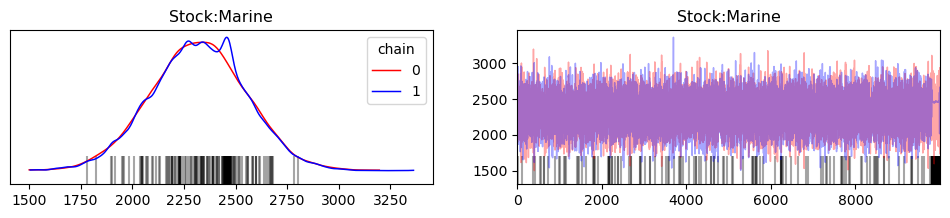

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


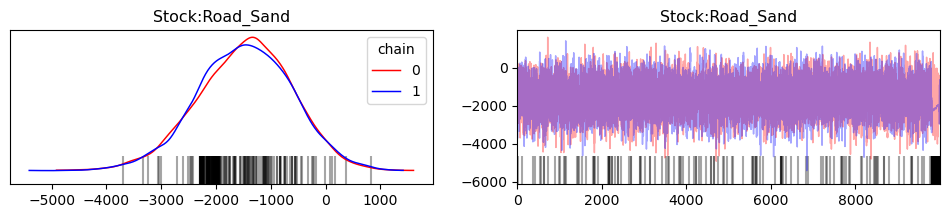

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


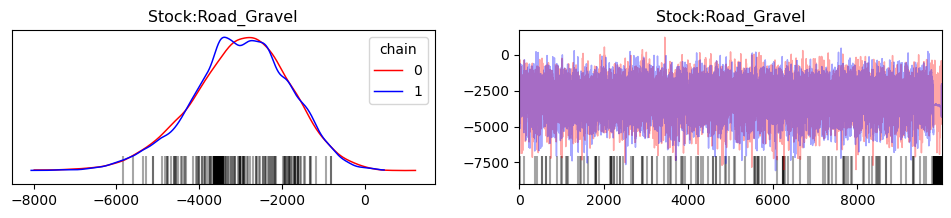

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


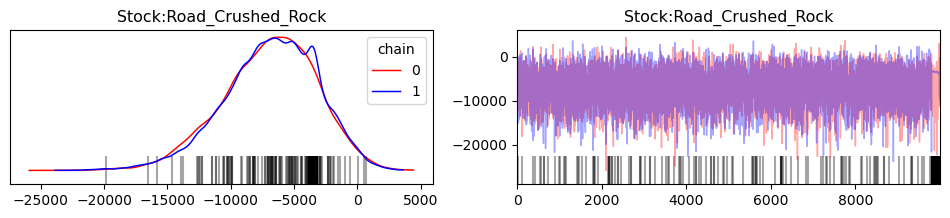

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


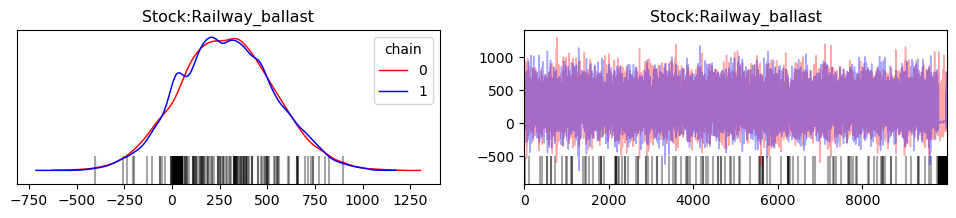

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


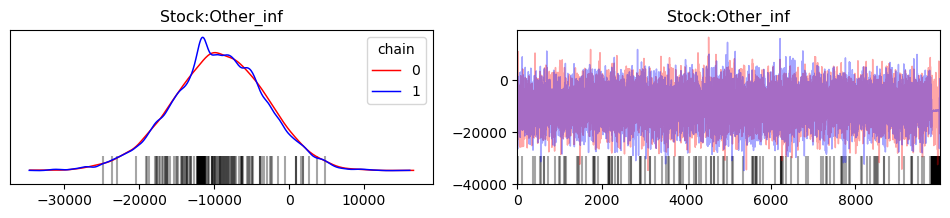

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


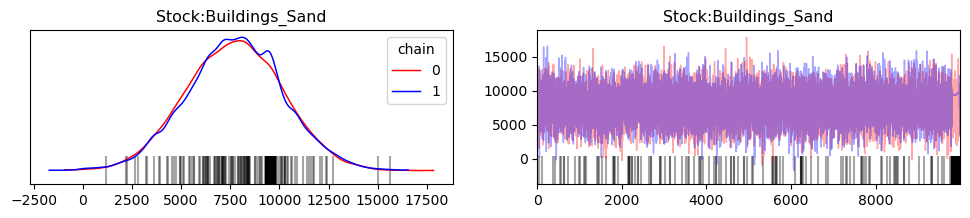

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


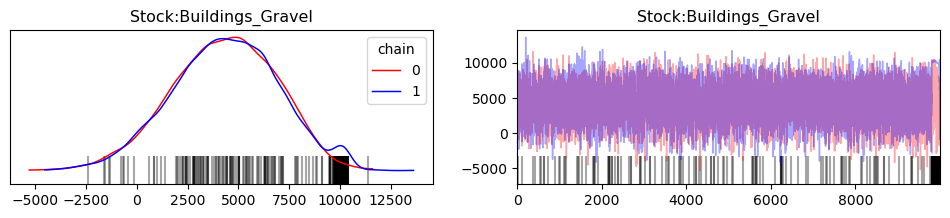

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


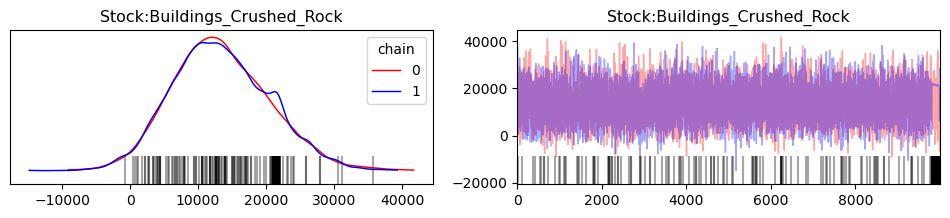

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


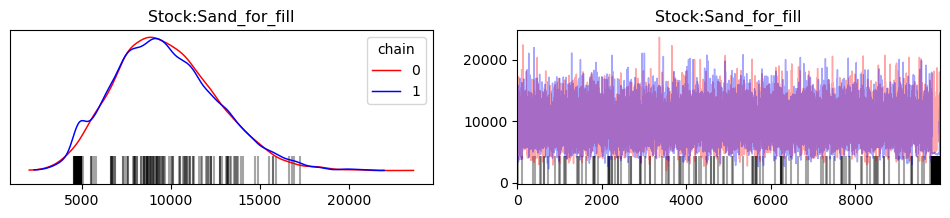

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


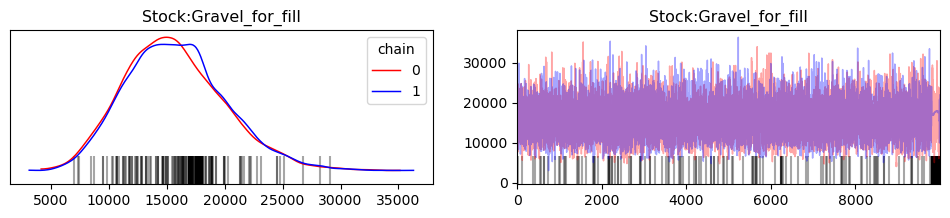

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


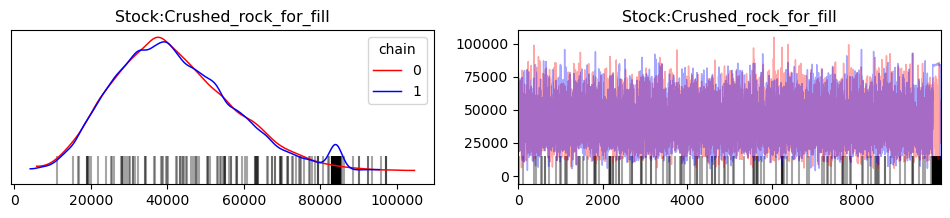

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


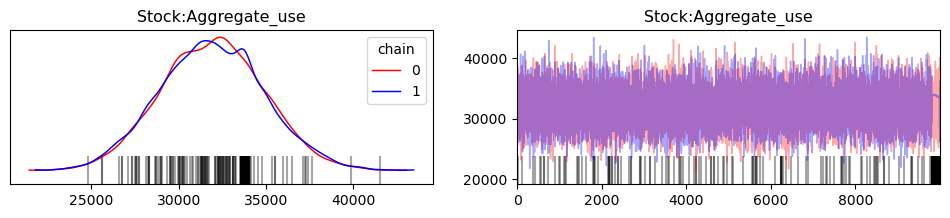

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


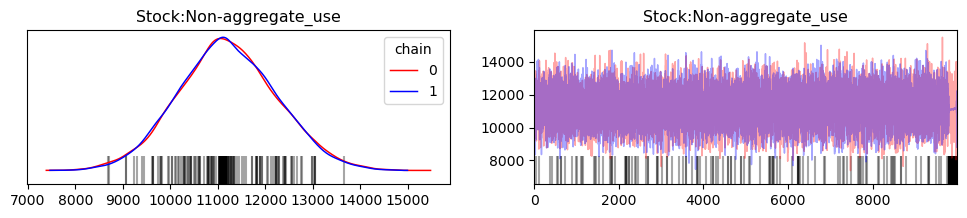

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


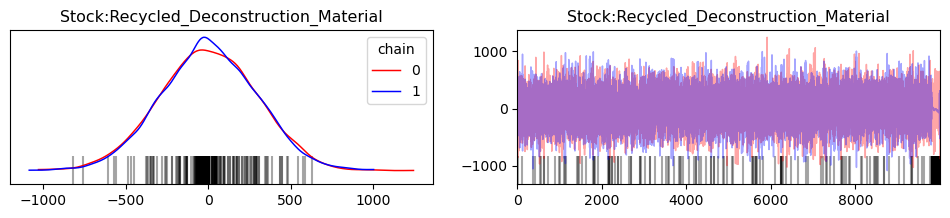

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


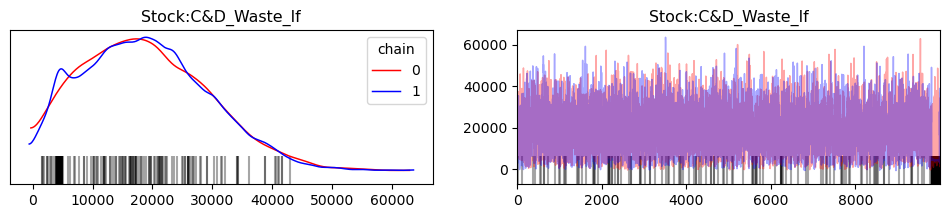

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


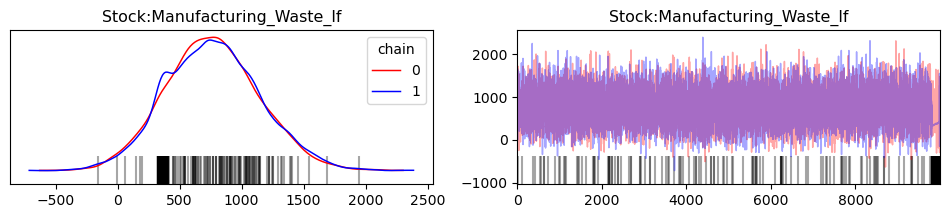

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


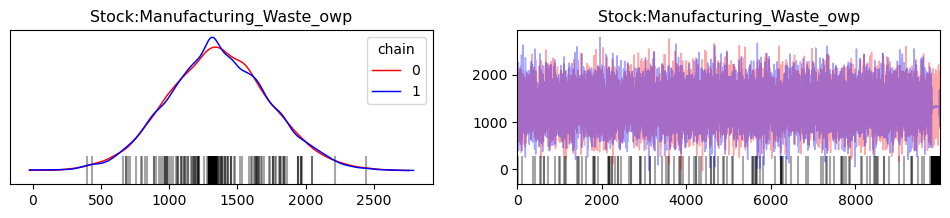

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


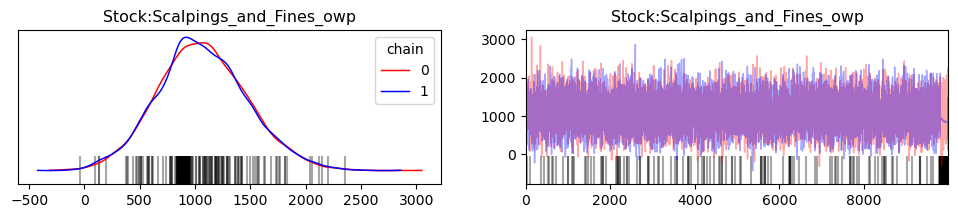

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


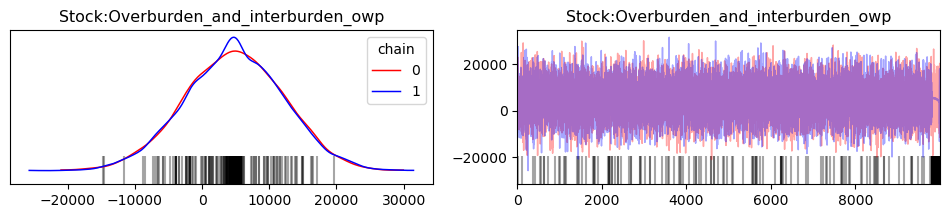

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


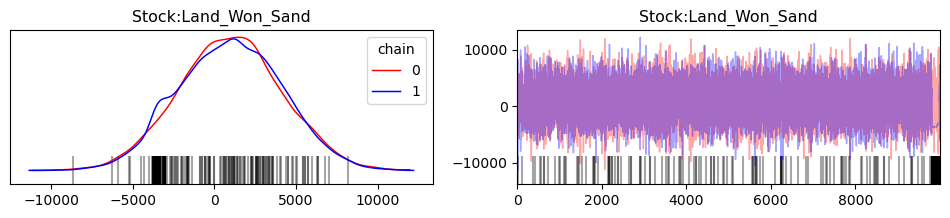

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


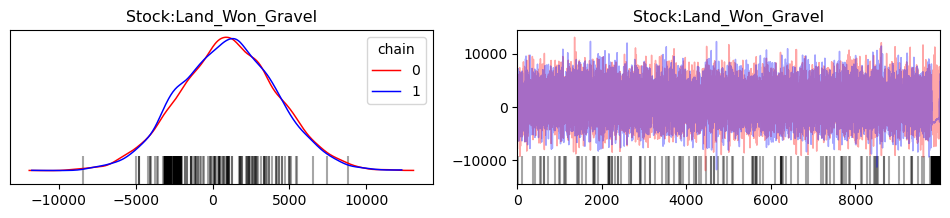

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


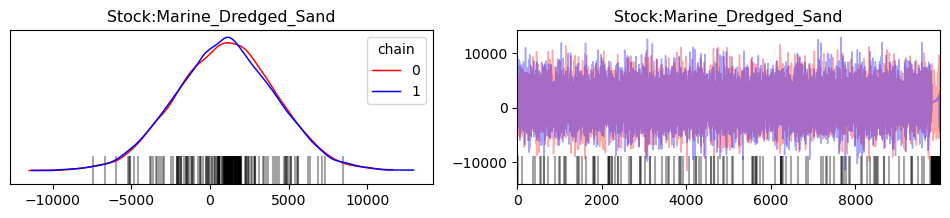

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


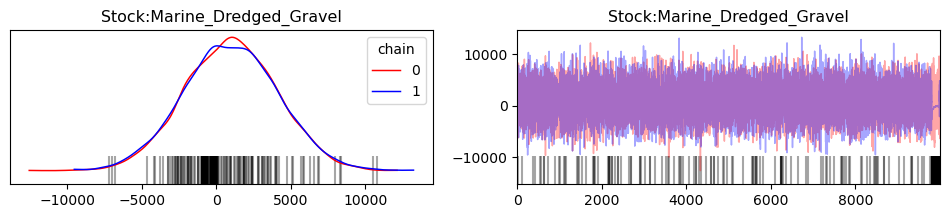

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


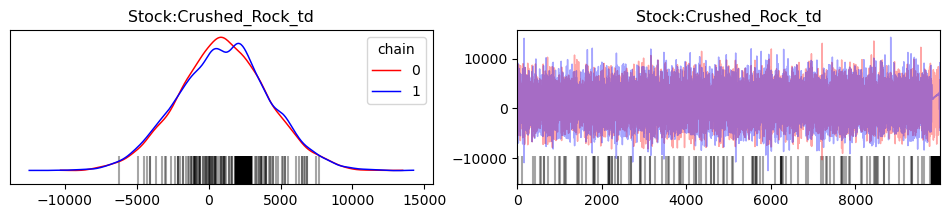

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


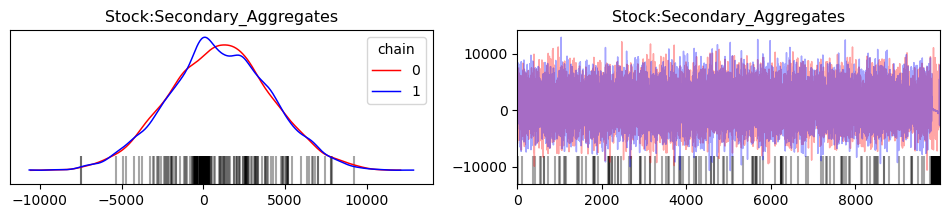

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


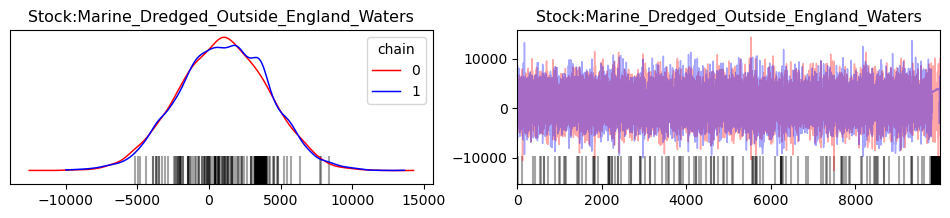

In [17]:
#generate traceplots for the change in stock variables

labels=[processnamesdict[str(x)] for x in availablechildstocks]

import arviz.labels as azl

plt.tight_layout()
for i in range(0,len(labels)):
    
    labeller = azl.MapLabeller(var_name_map={"stocks": r"Stock"+":"+labels[i]})
    
    posteriorstocktraceplots=az.plot_trace(trace, var_names="stocks",compact=True,show=True,backend="matplotlib", coords={'stocks_dim_0': [i]},labeller=labeller,legend=True,chain_prop={"color": ['r', 'b']})

    #posteriorstocktraceplots[0,0].get_figure().savefig("outputgraphstrace"+filelabeler(useratiodata)+"/"+"Stocktrace"+"_"+labels[i]+filelabeler(useratiodata)+".pdf")

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


<Figure size 640x480 with 0 Axes>

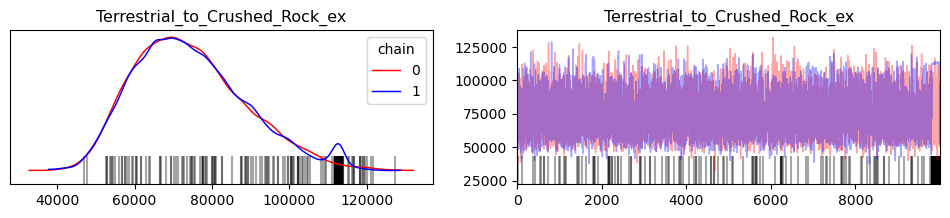

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


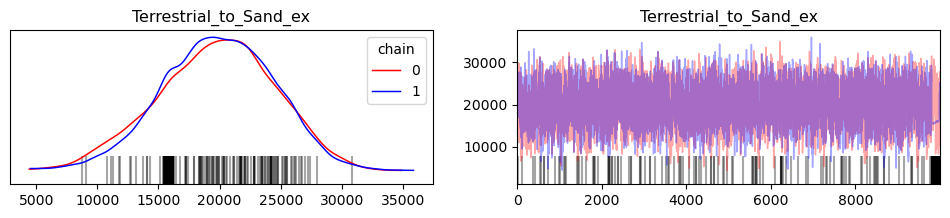

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


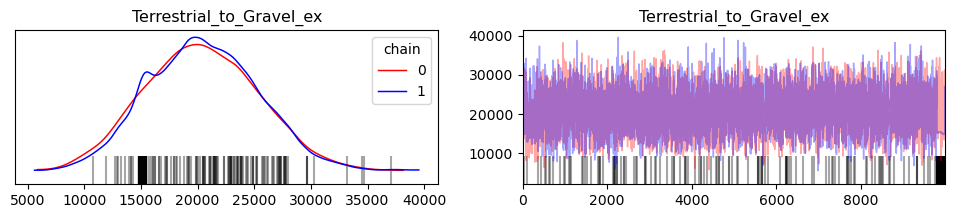

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


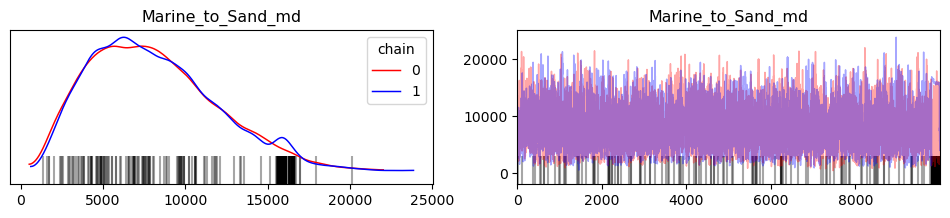

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


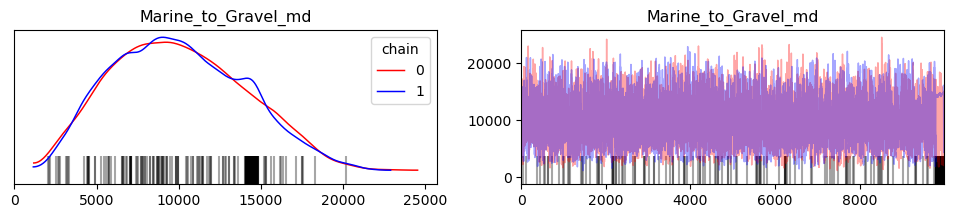

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


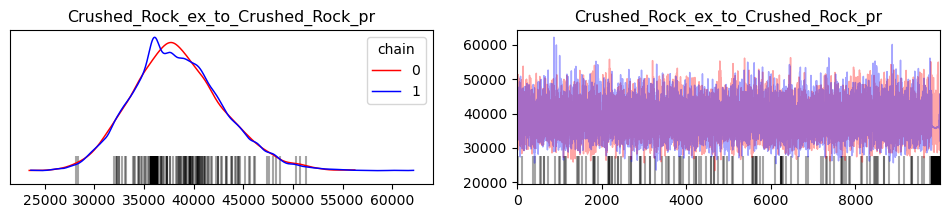

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


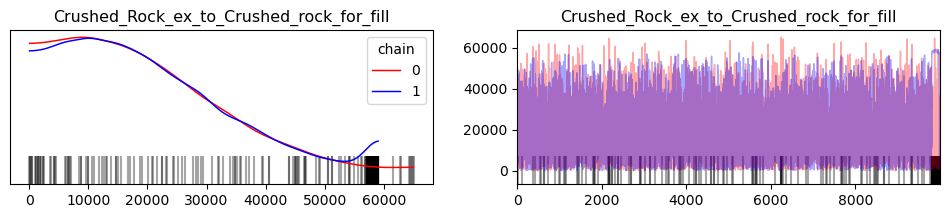

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


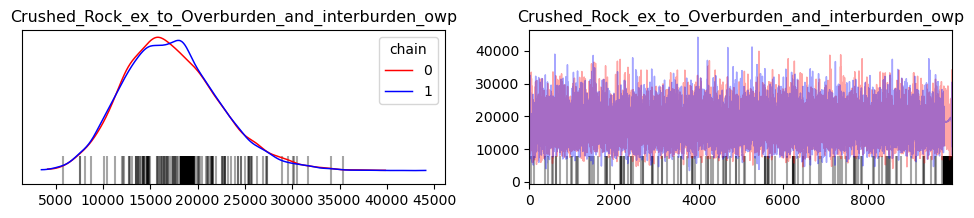

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


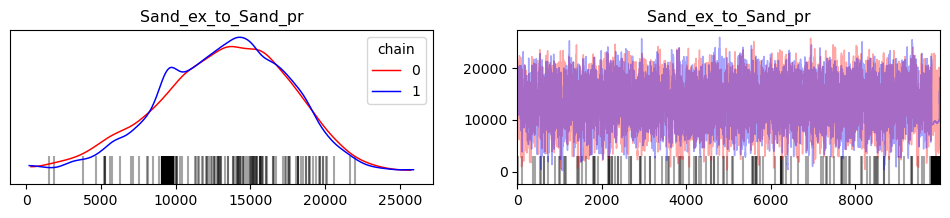

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


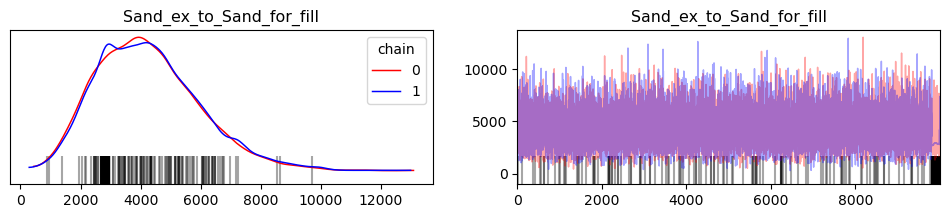

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


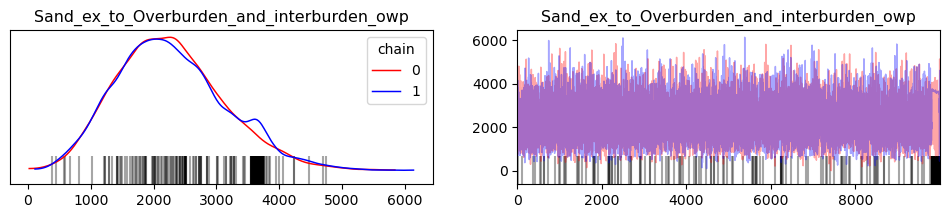

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


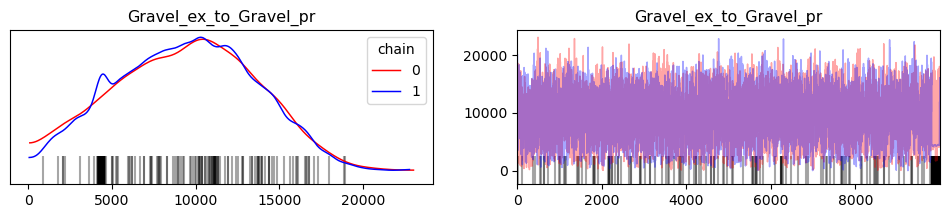

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


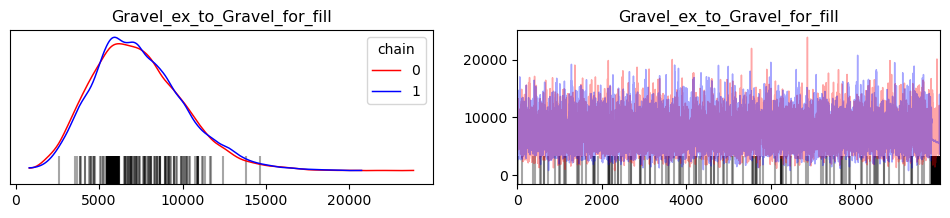

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


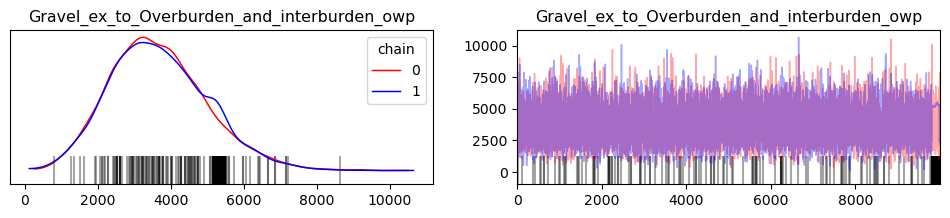

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


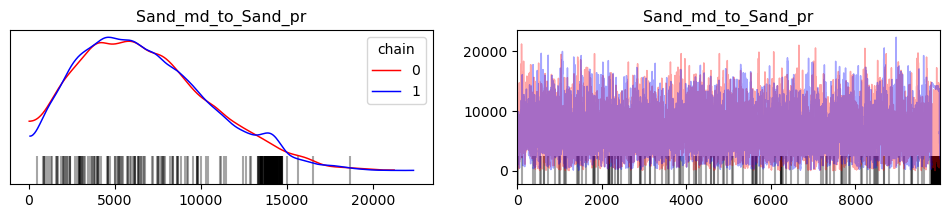

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


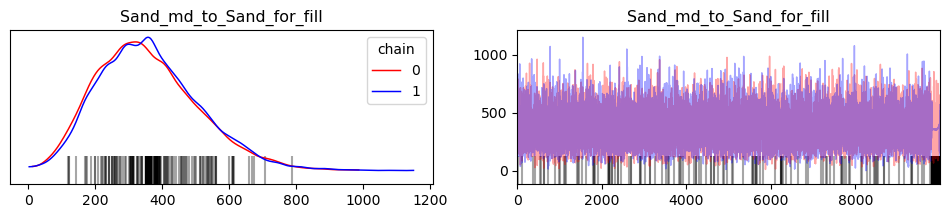

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


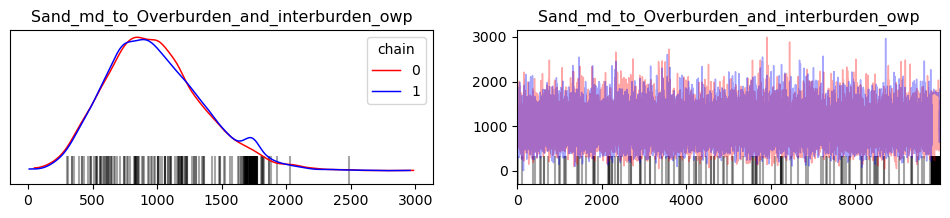

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


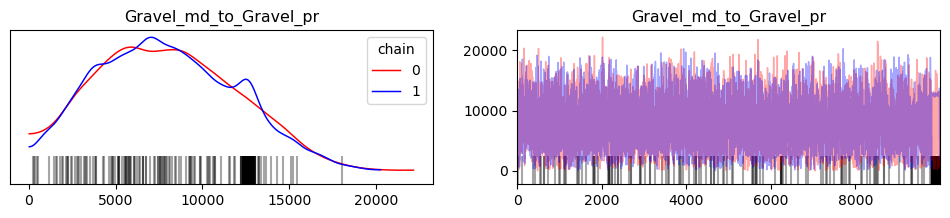

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


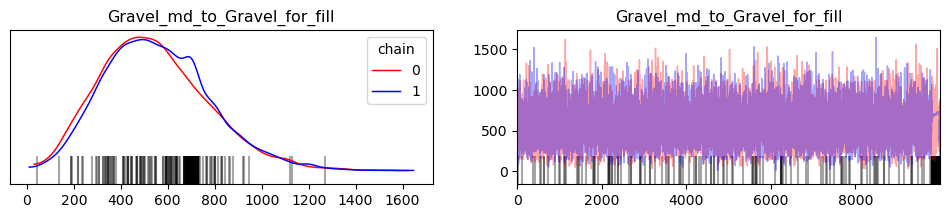

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


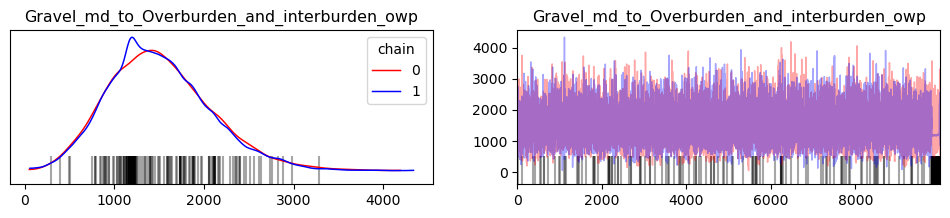

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


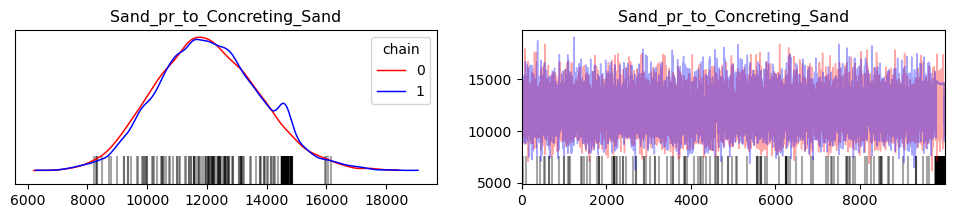

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


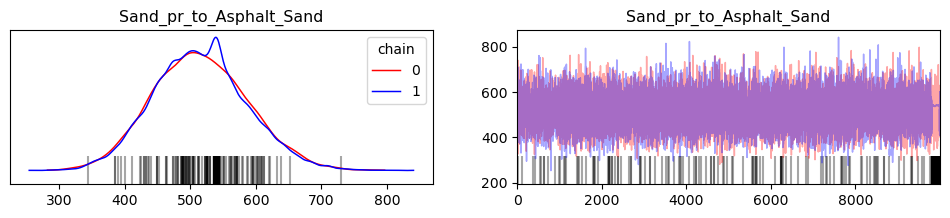

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


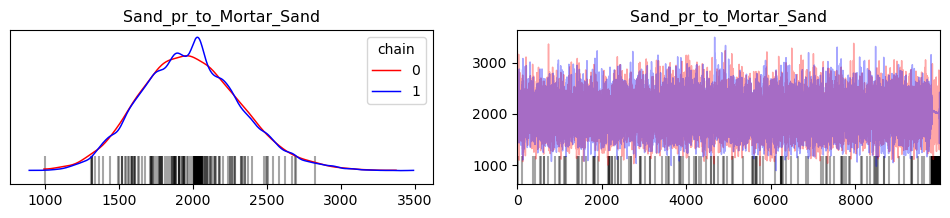

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


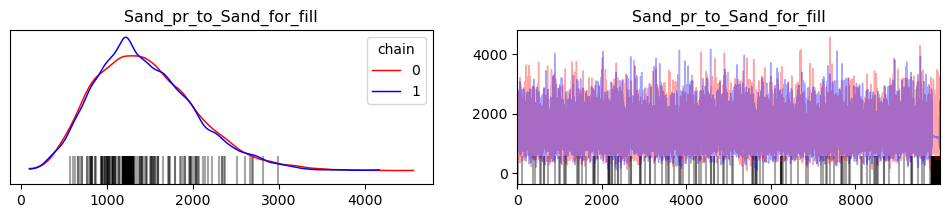

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


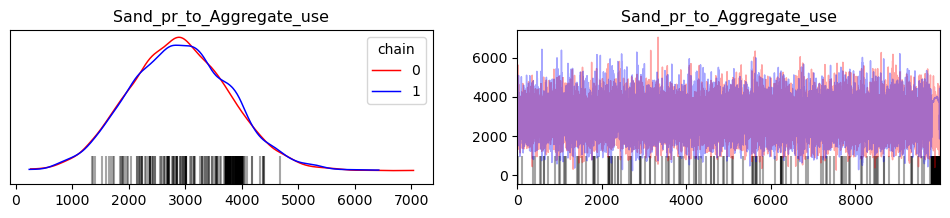

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


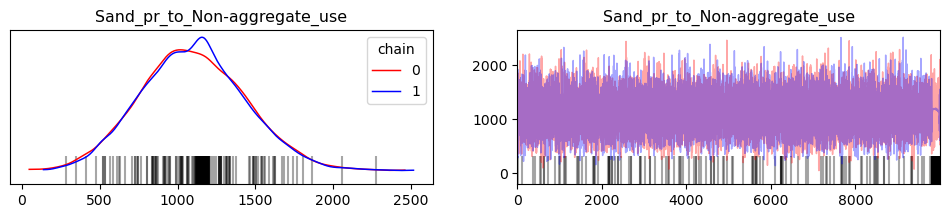

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


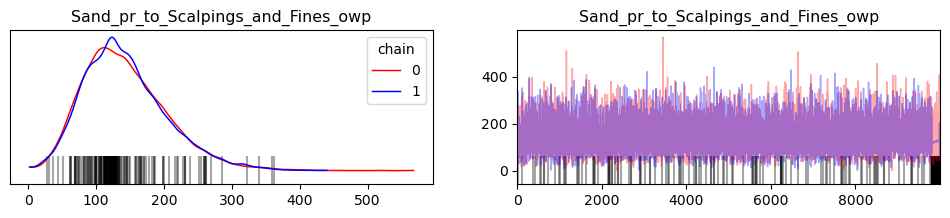

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


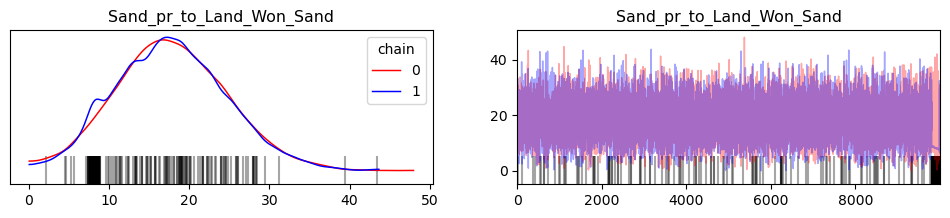

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


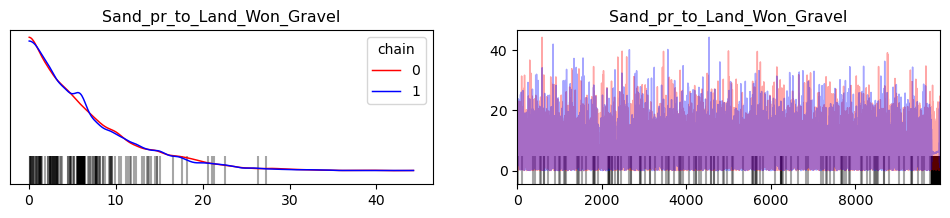

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


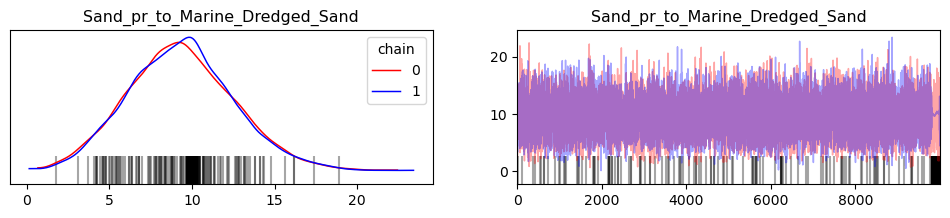

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


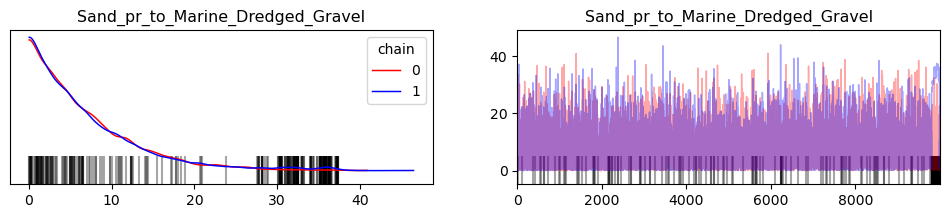

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


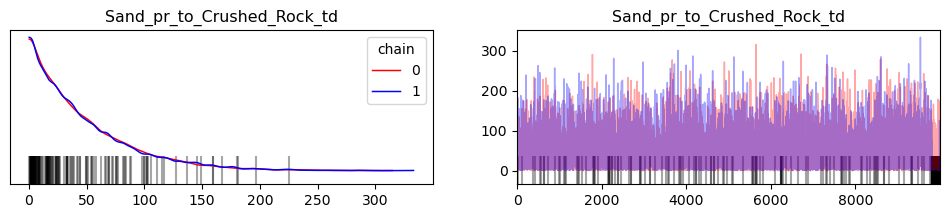

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


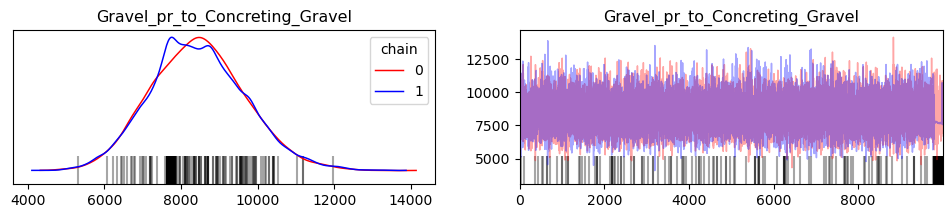

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


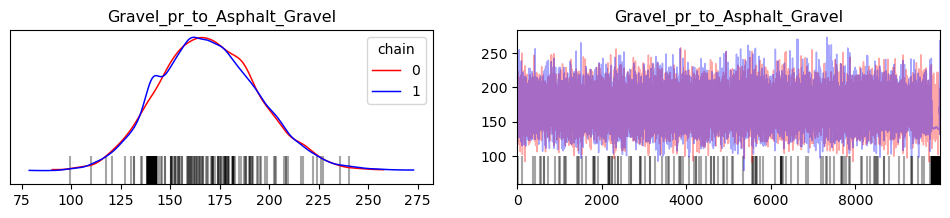

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


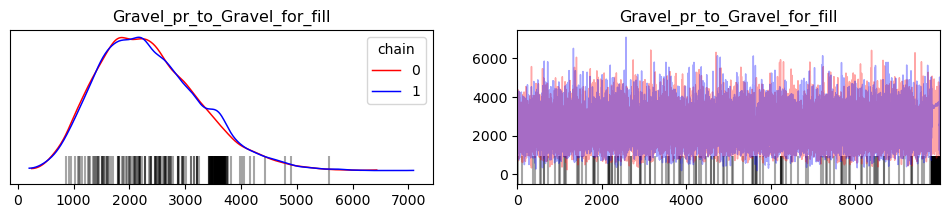

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


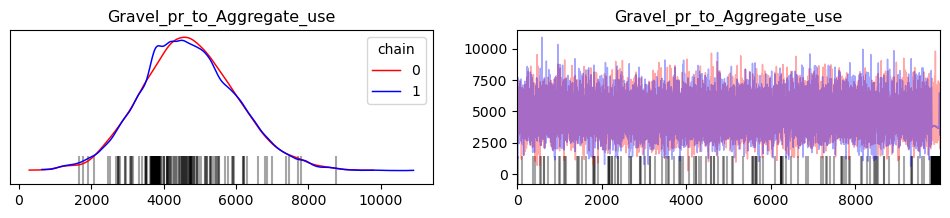

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


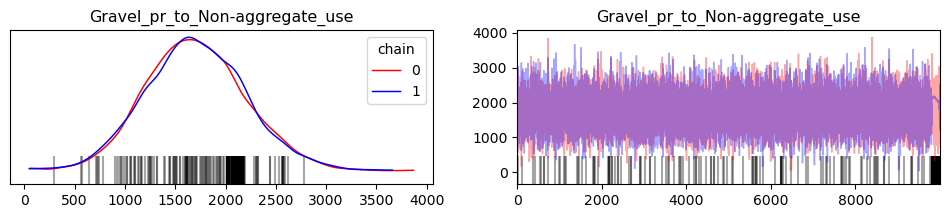

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


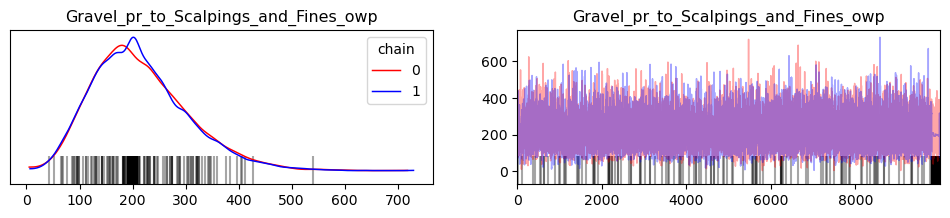

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


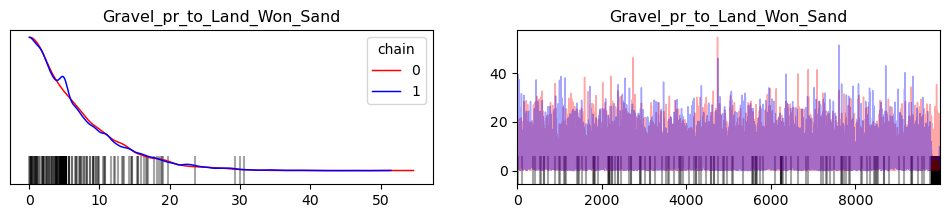

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


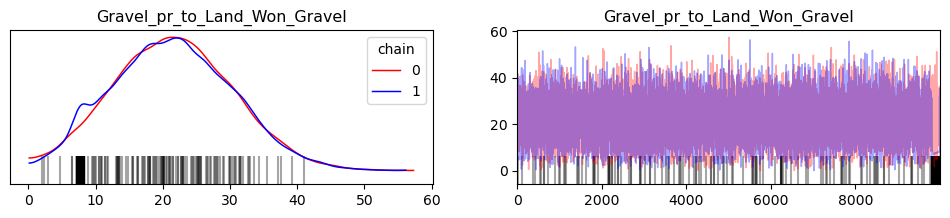

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


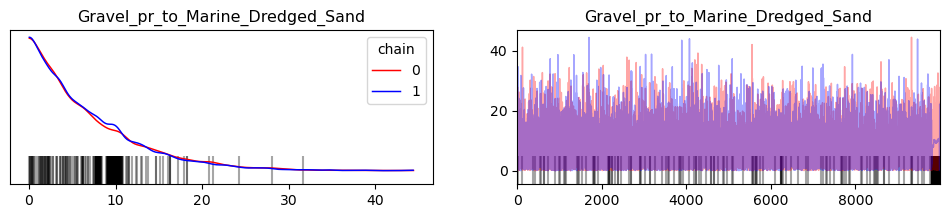

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


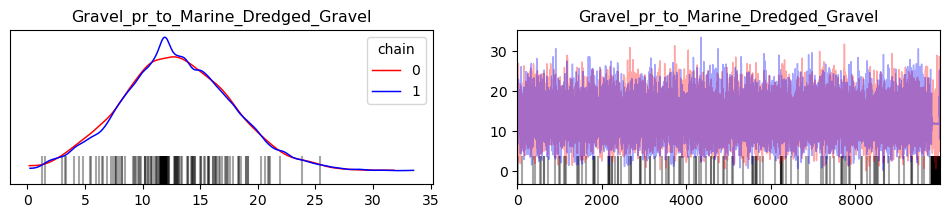

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


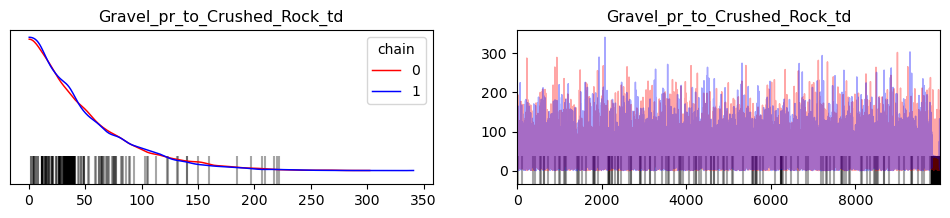

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


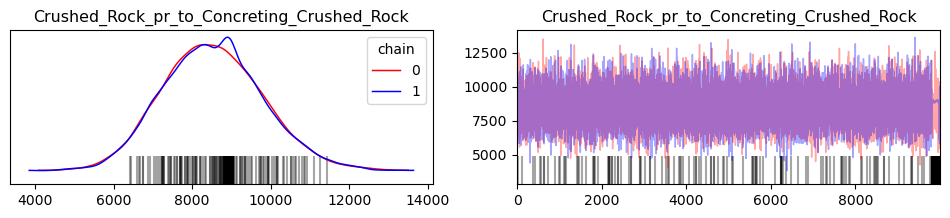

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


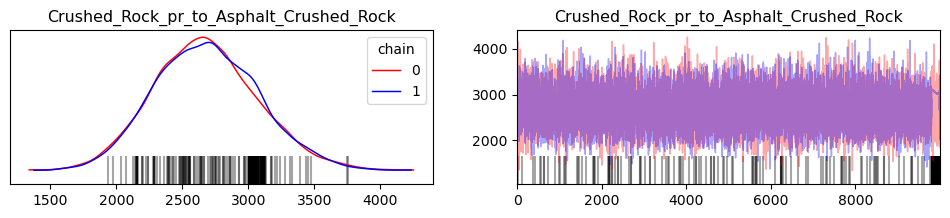

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


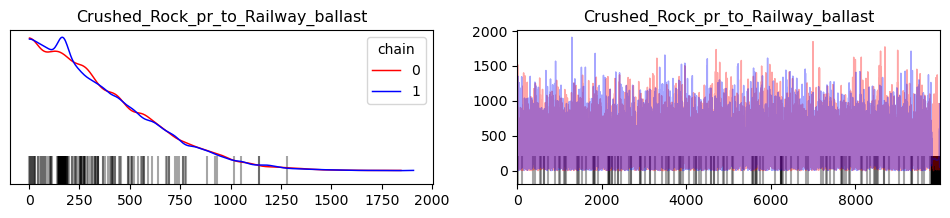

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


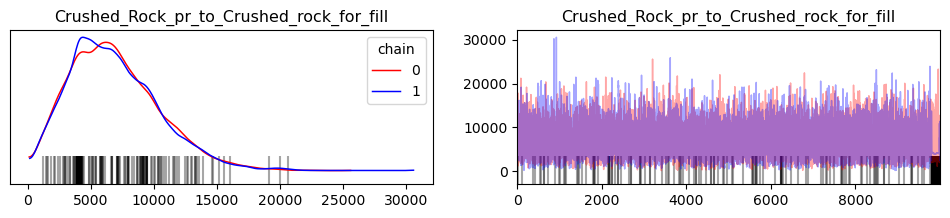

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


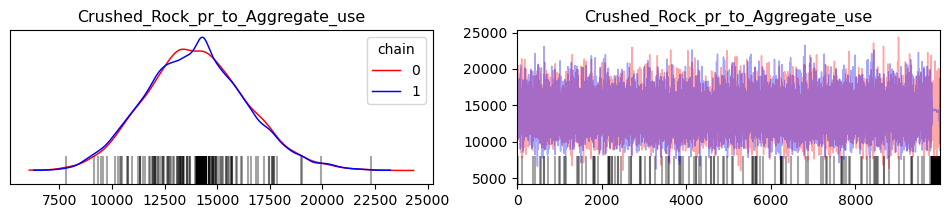

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


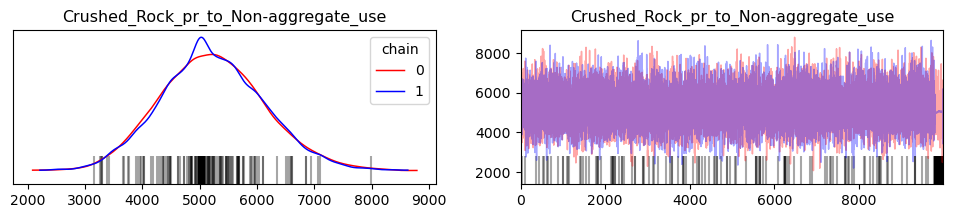

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


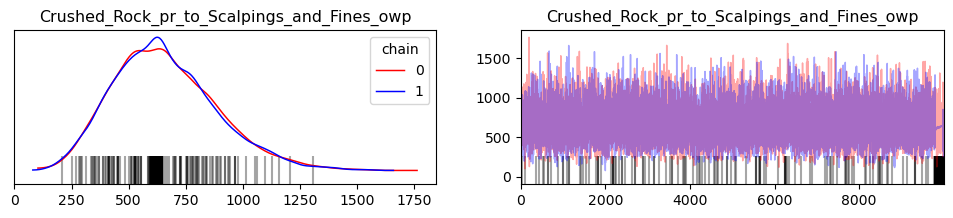

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


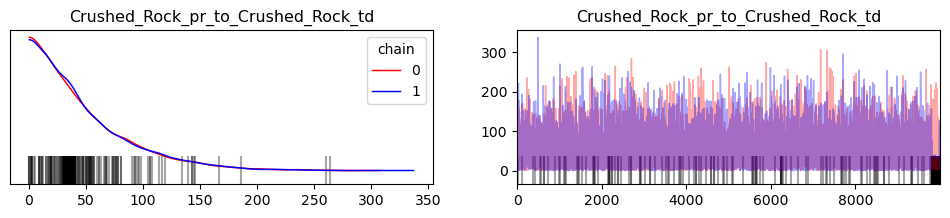

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


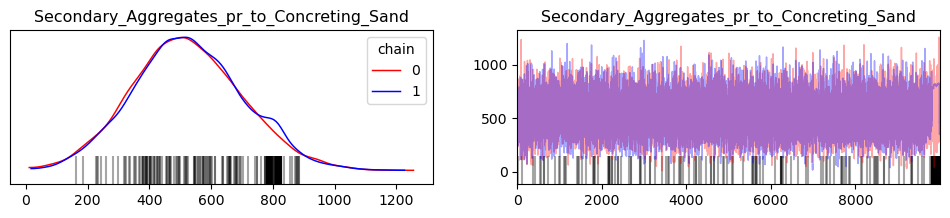

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


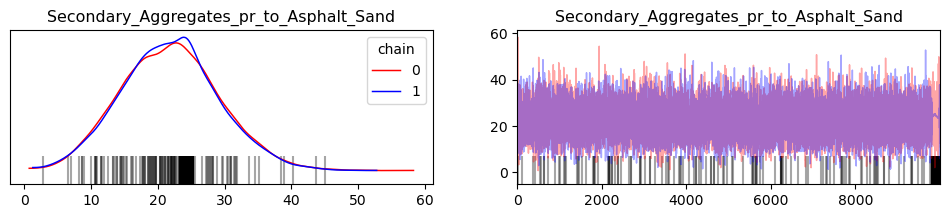

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


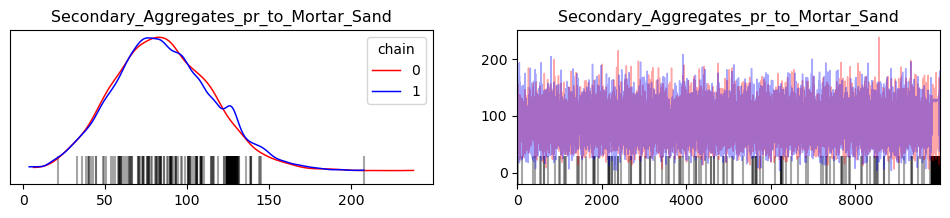

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


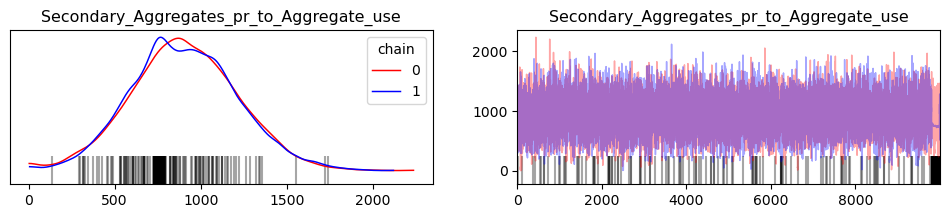

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


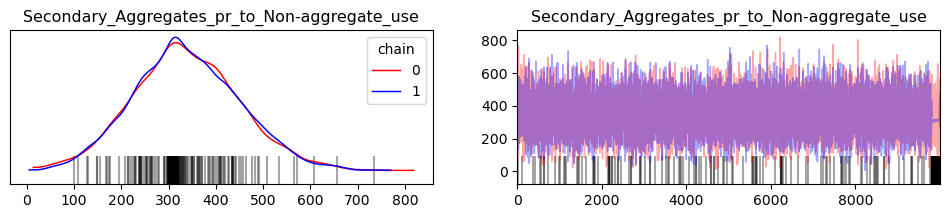

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


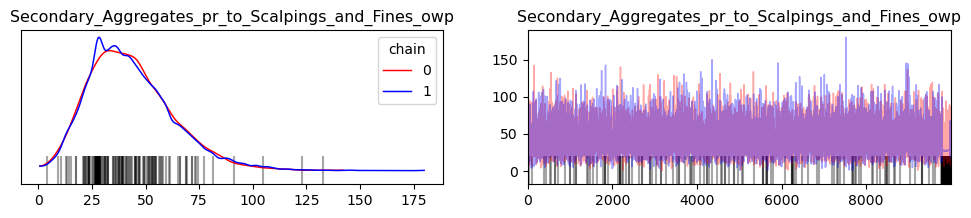

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


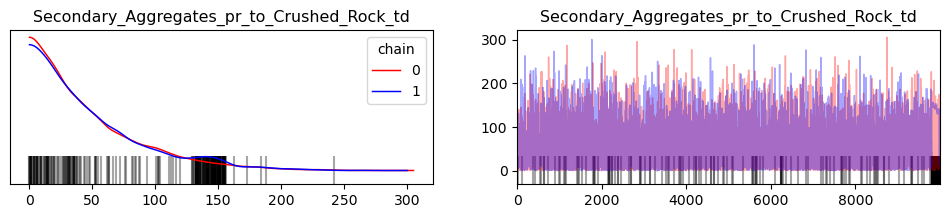

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


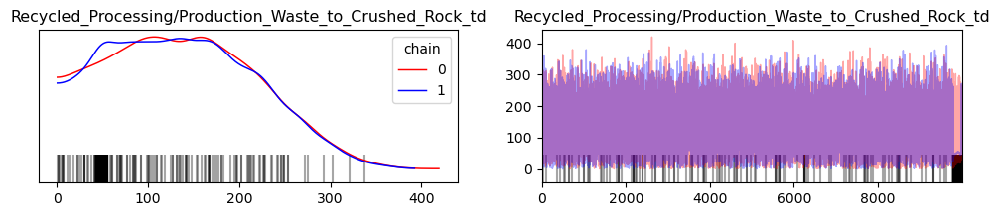

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


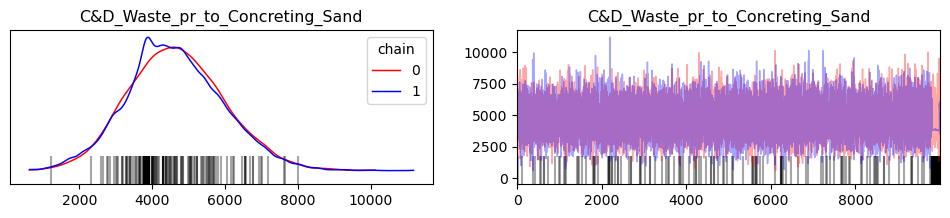

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


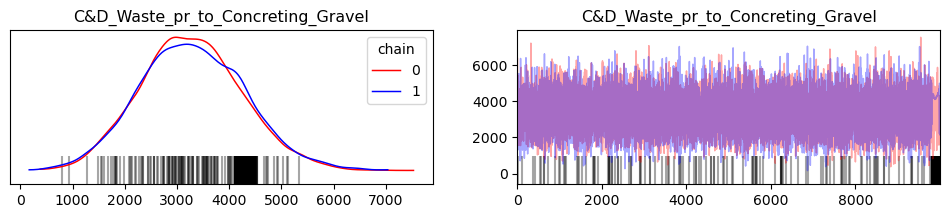

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


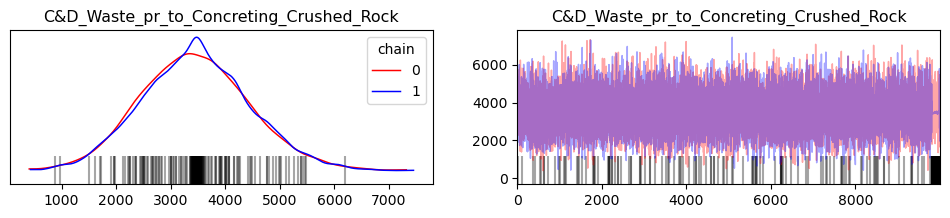

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


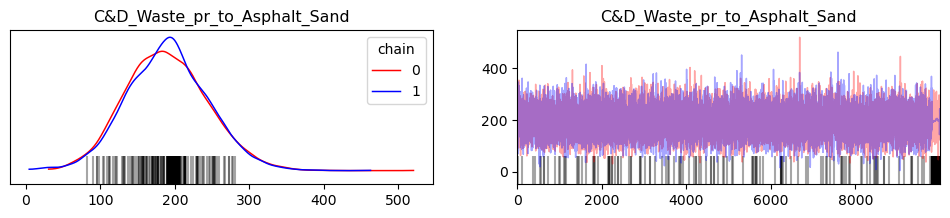

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


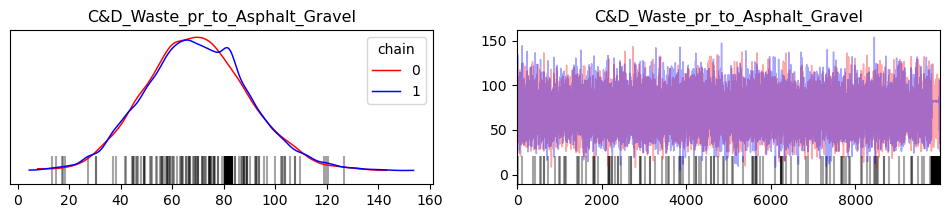

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


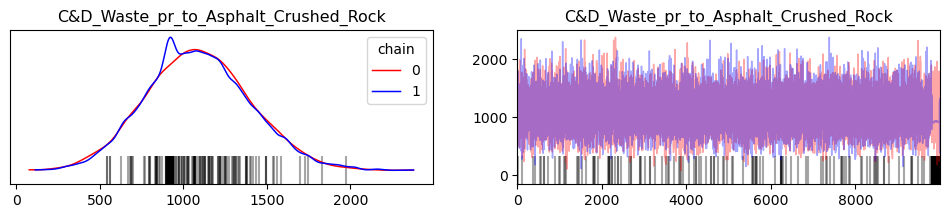

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


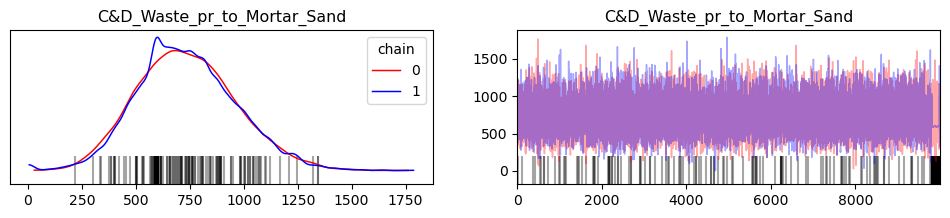

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


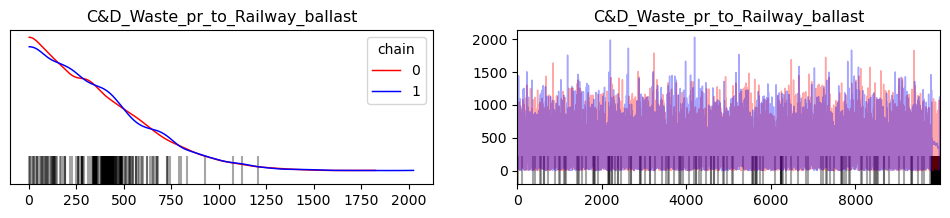

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


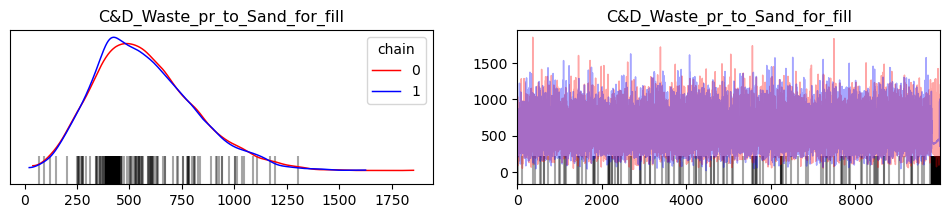

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


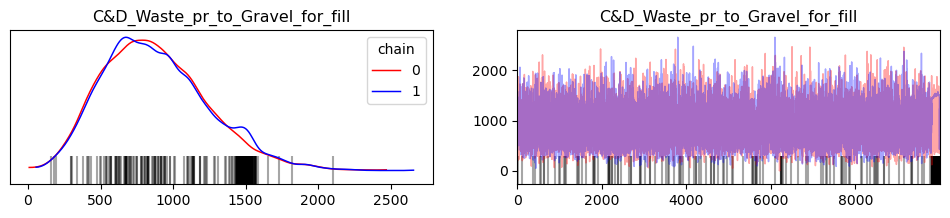

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


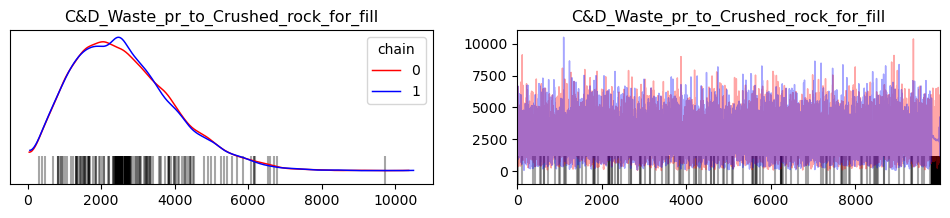

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


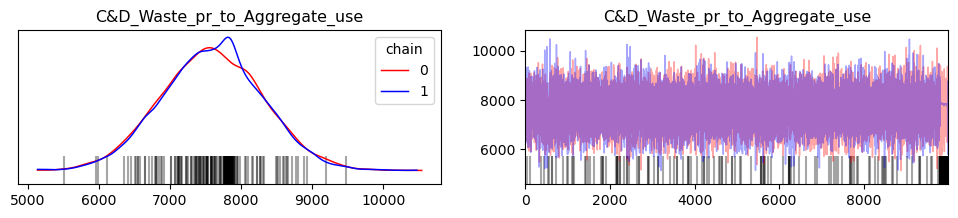

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


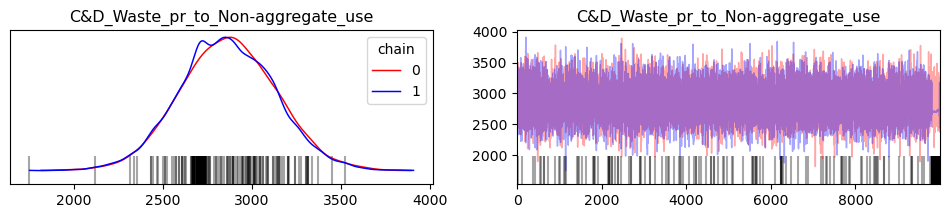

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


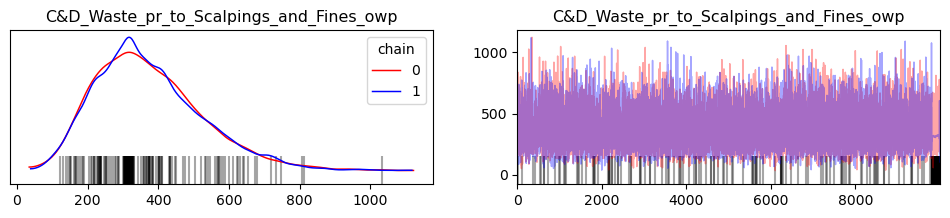

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


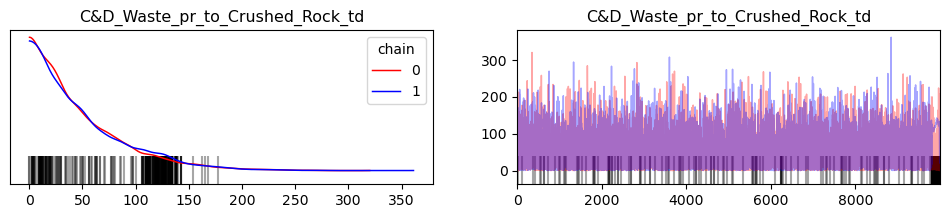

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


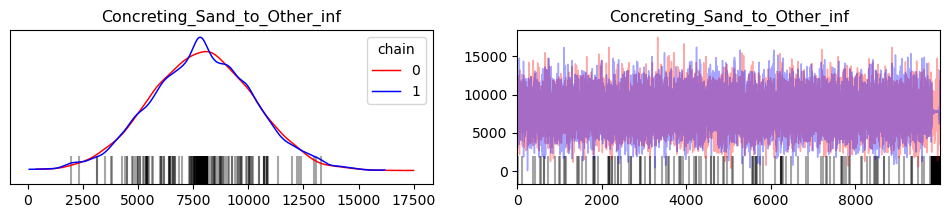

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


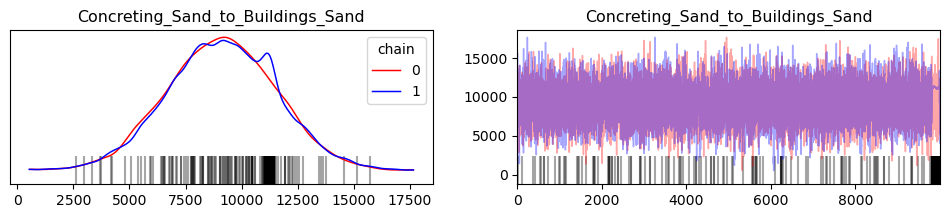

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


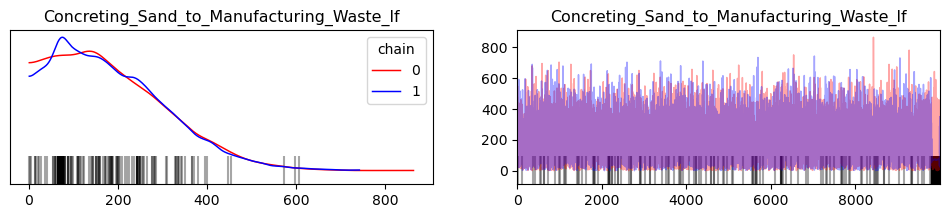

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


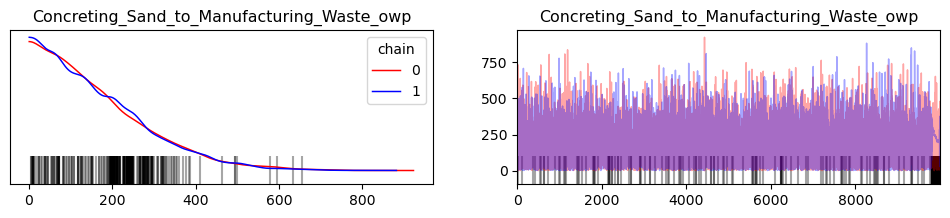

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


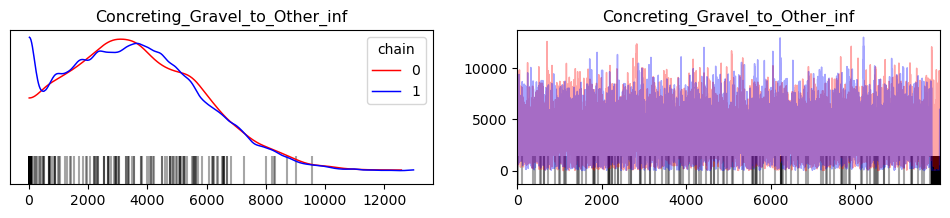

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


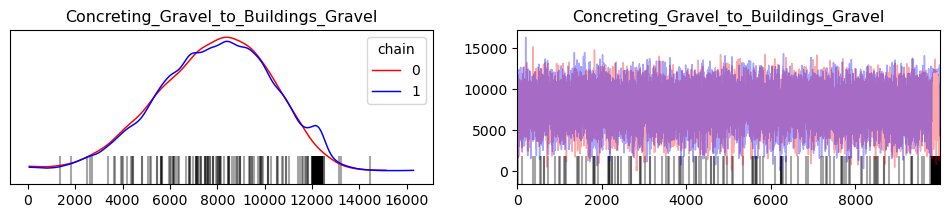

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


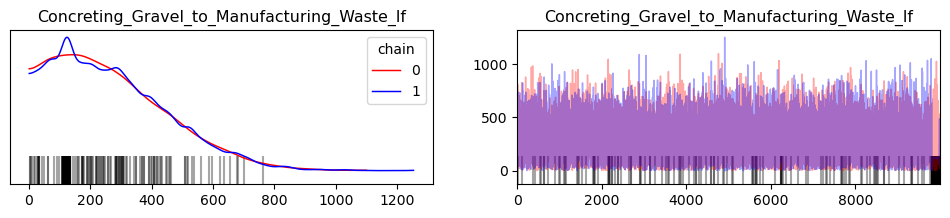

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


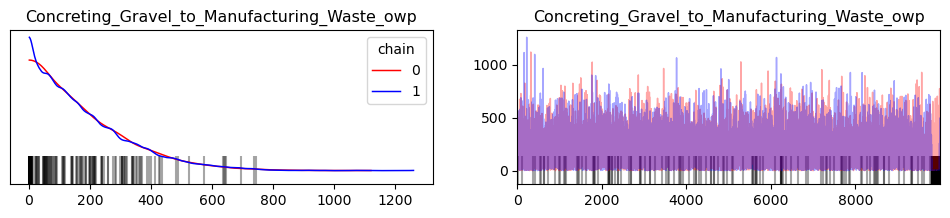

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


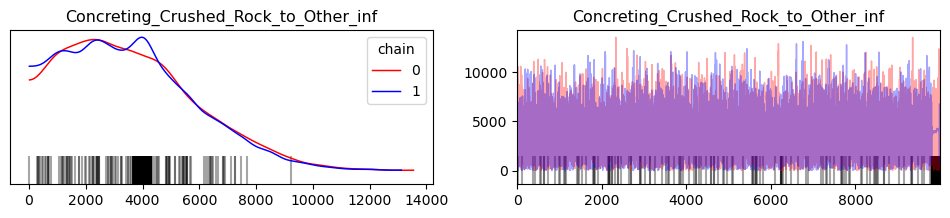

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


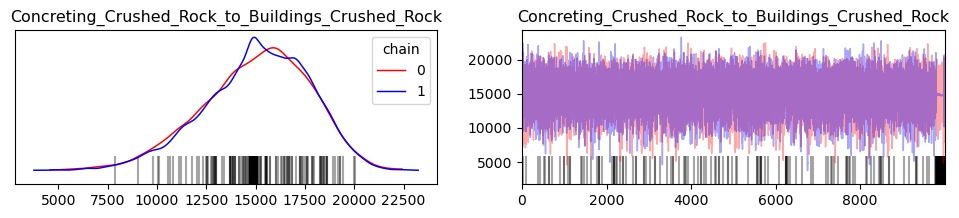

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


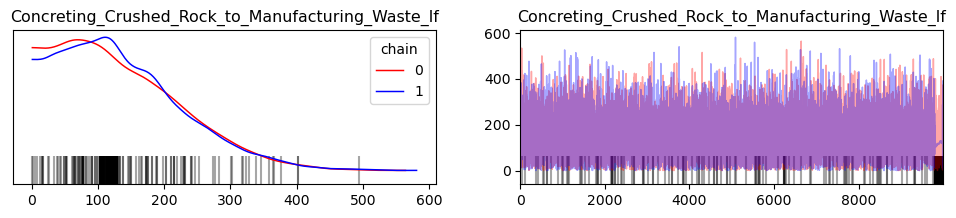

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


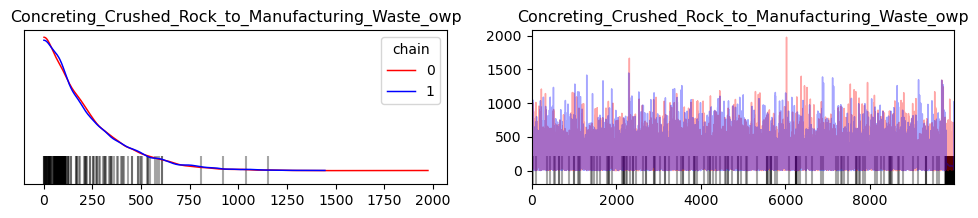

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


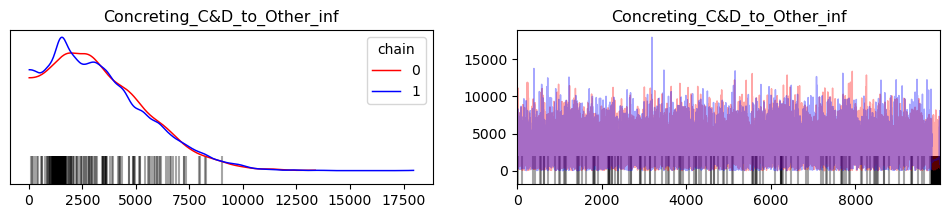

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


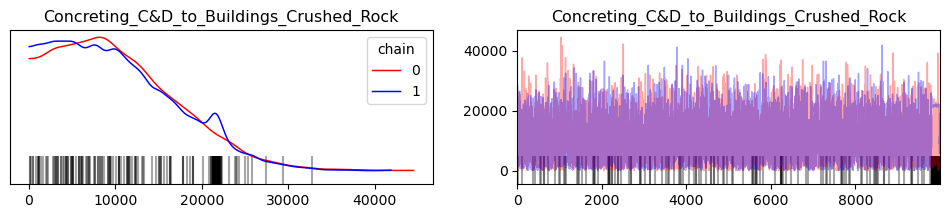

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


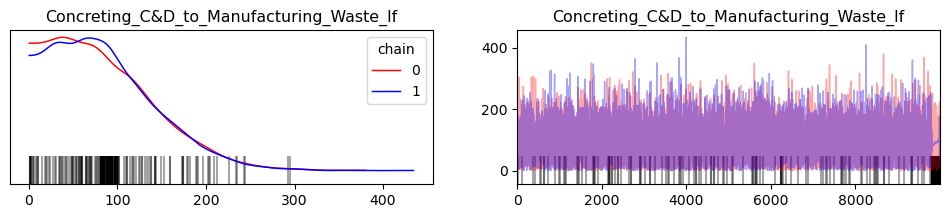

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


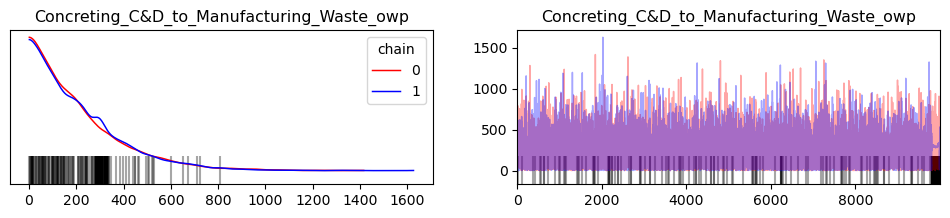

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


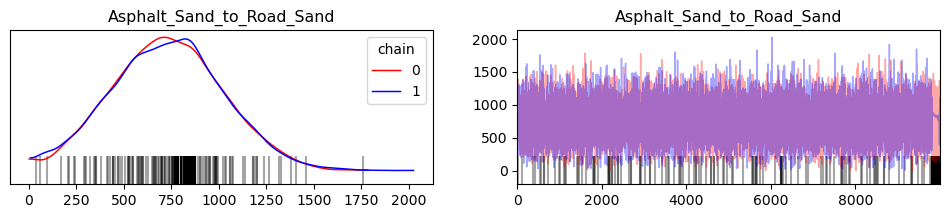

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


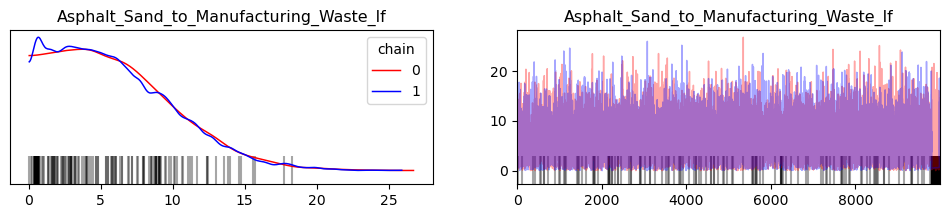

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


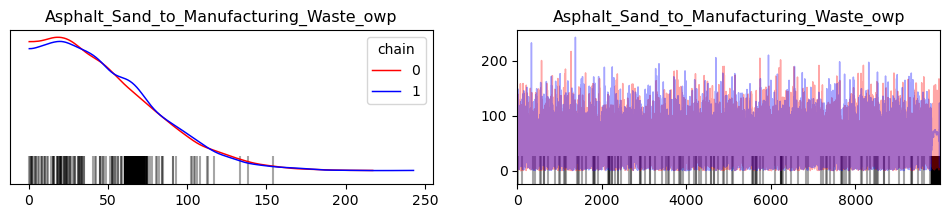

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


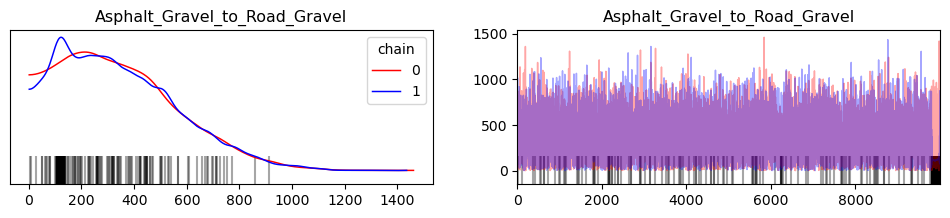

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


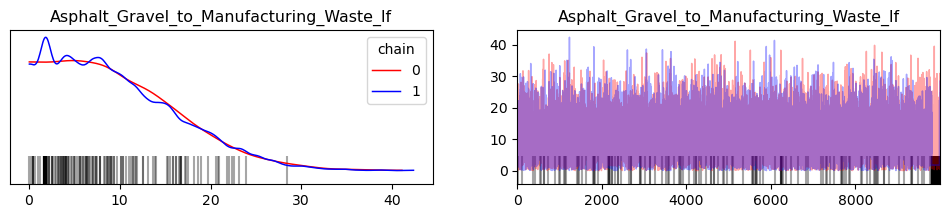

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


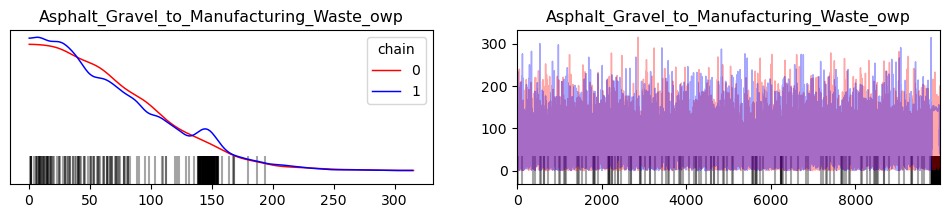

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


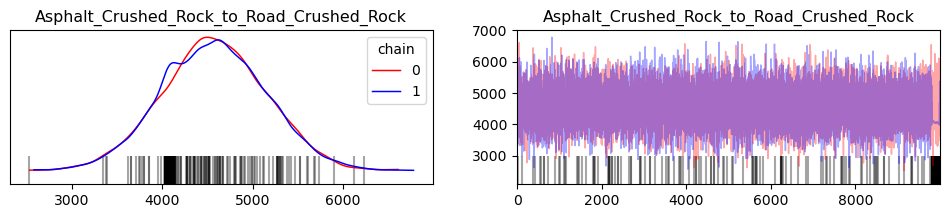

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


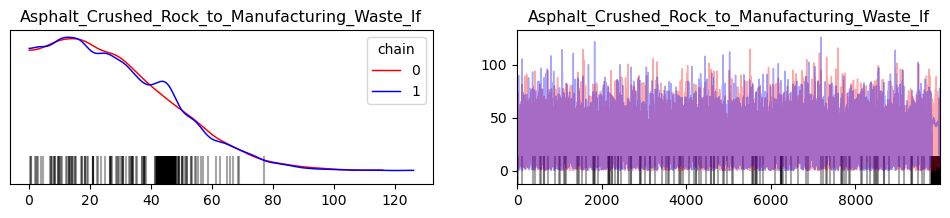

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


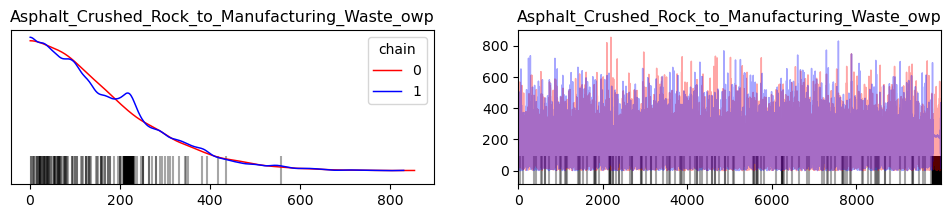

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


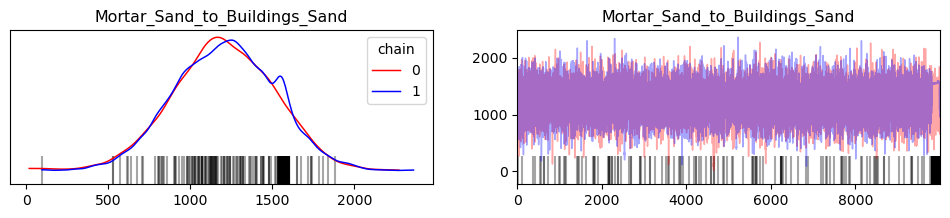

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


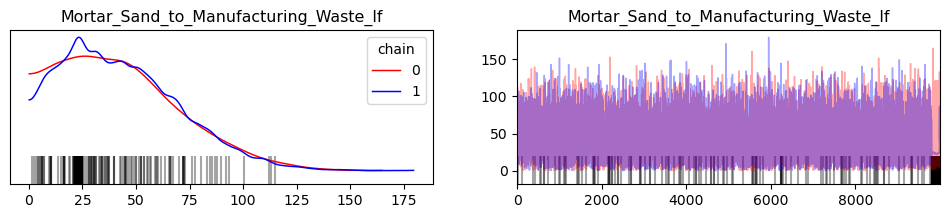

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


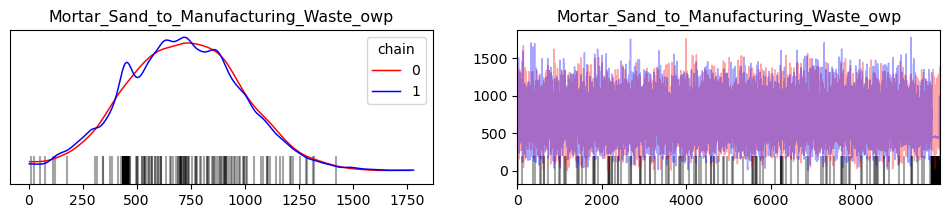

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


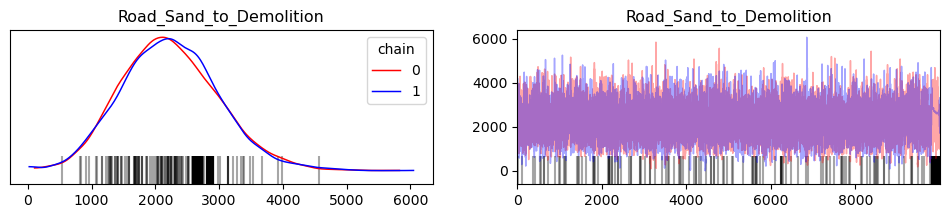

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


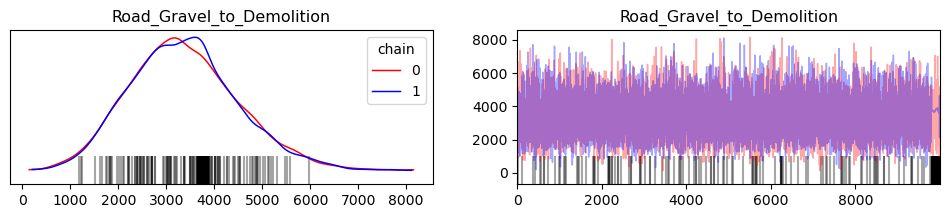

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


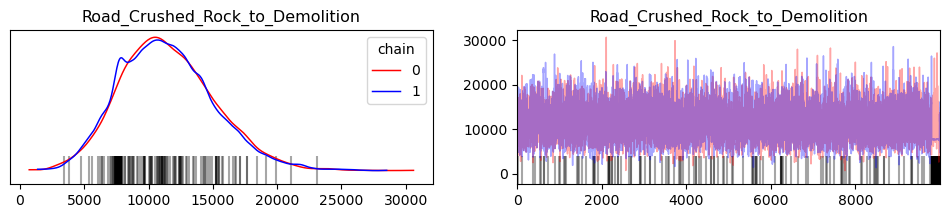

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


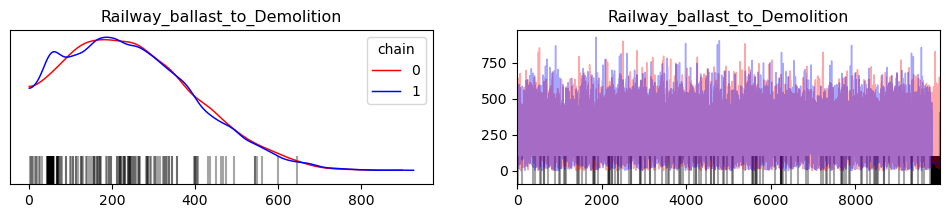

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


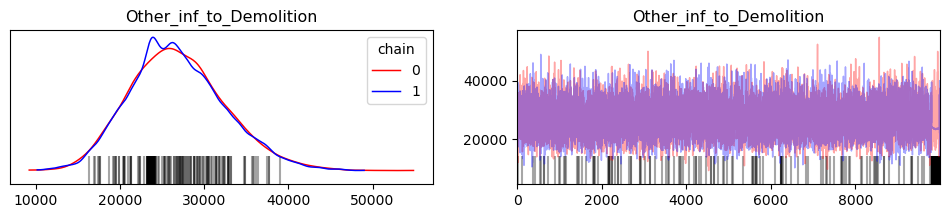

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


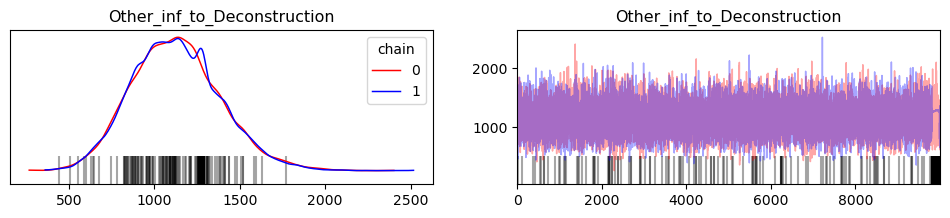

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


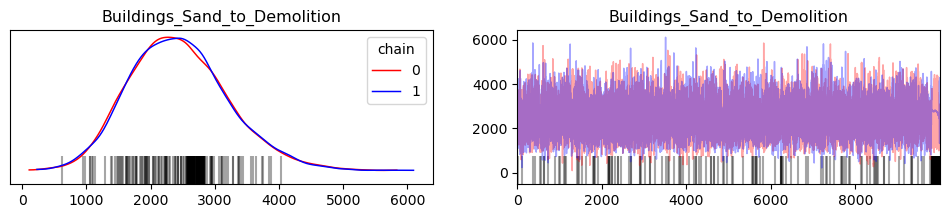

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


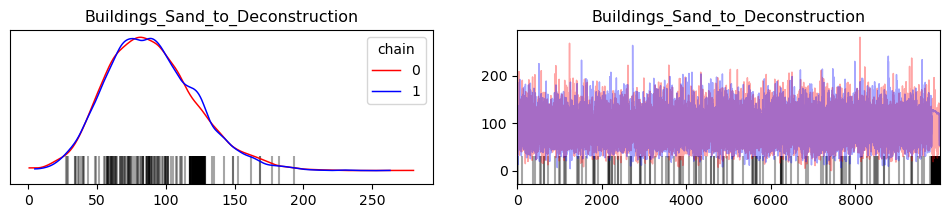

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


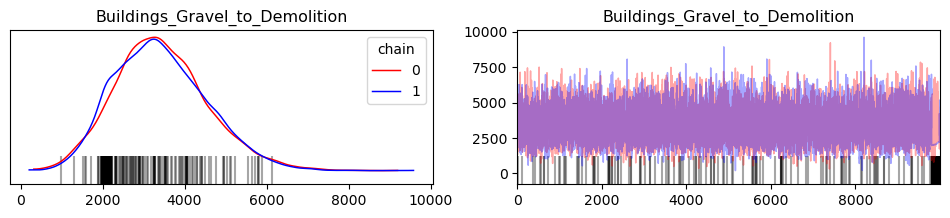

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


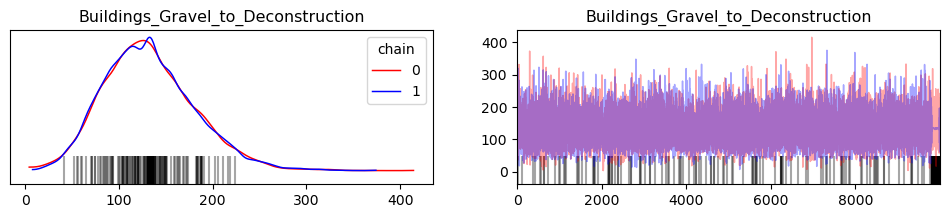

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


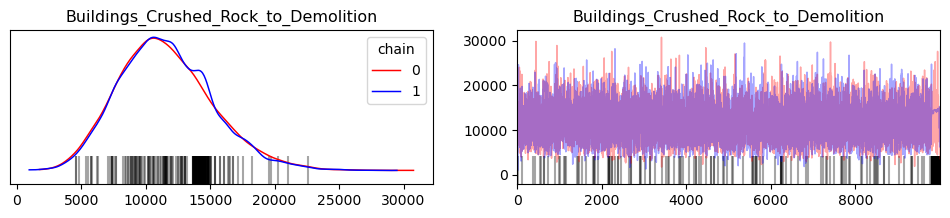

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


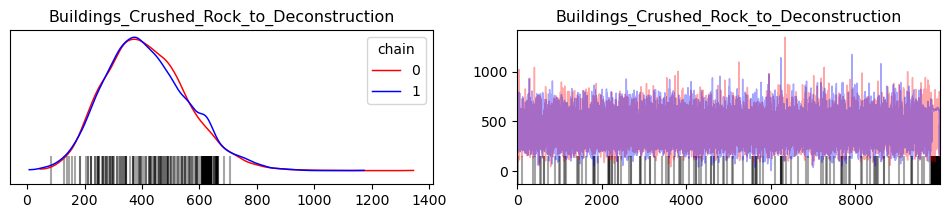

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


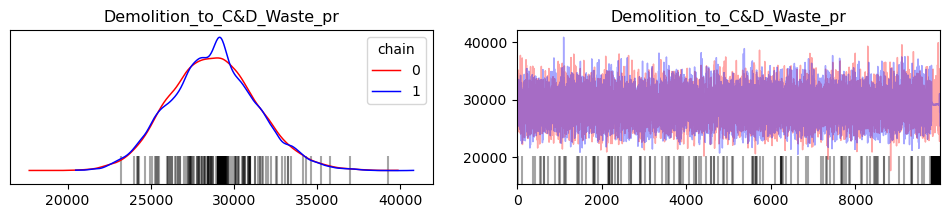

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


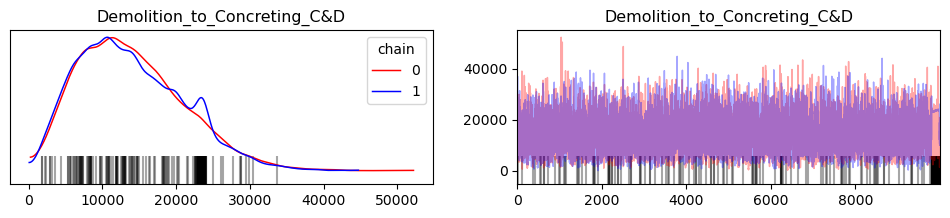

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


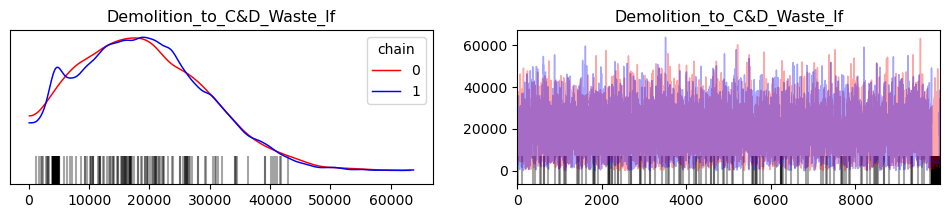

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


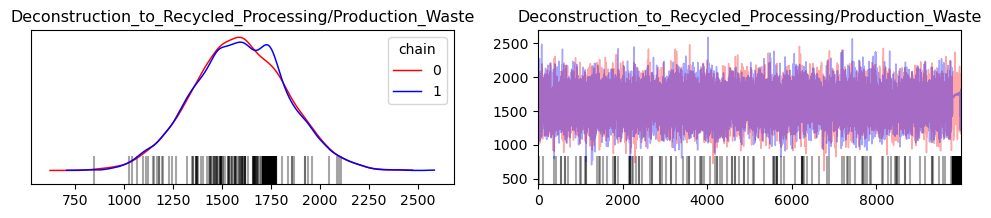

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


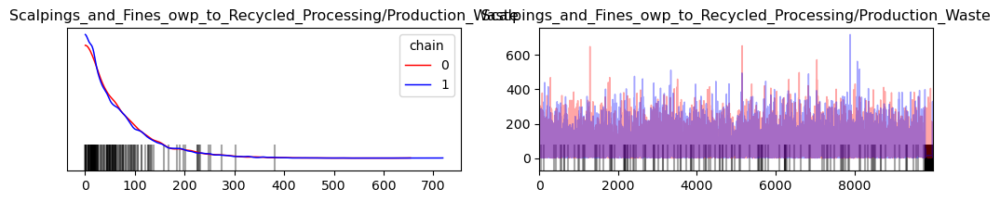

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


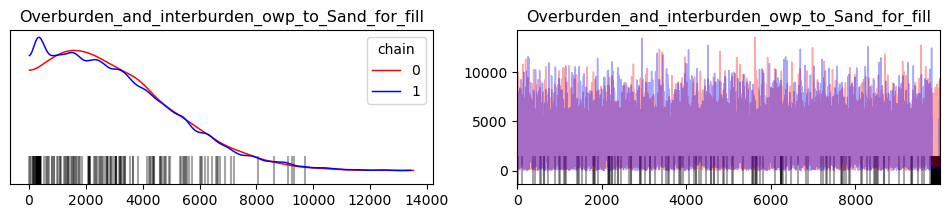

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


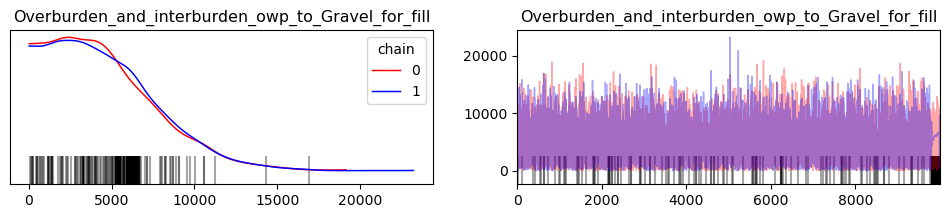

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


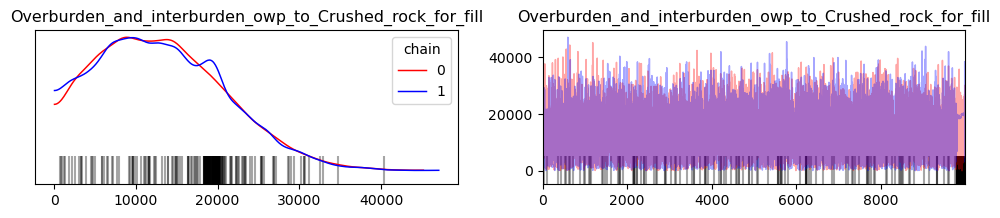

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


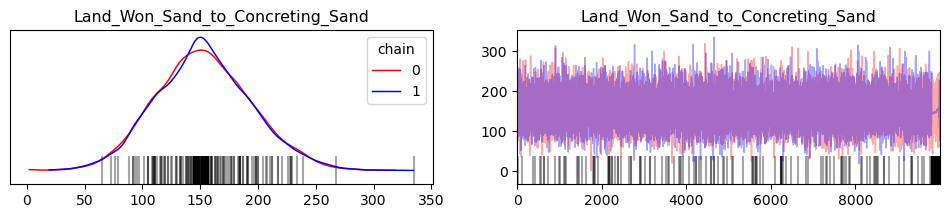

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


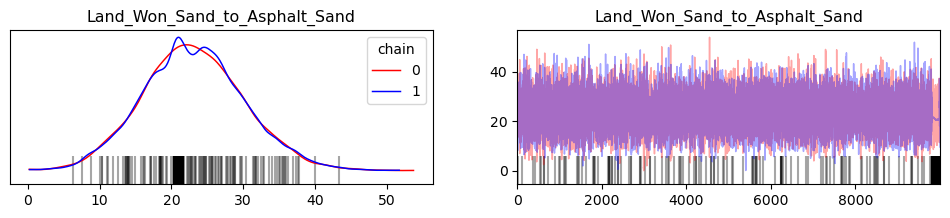

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


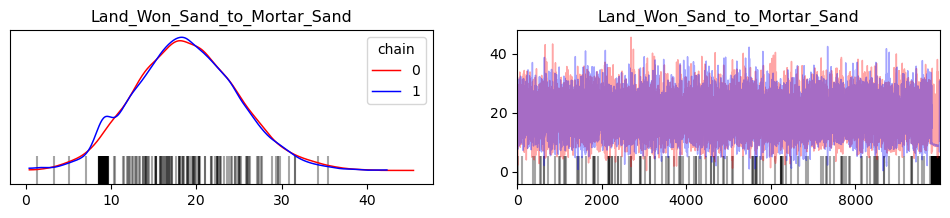

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


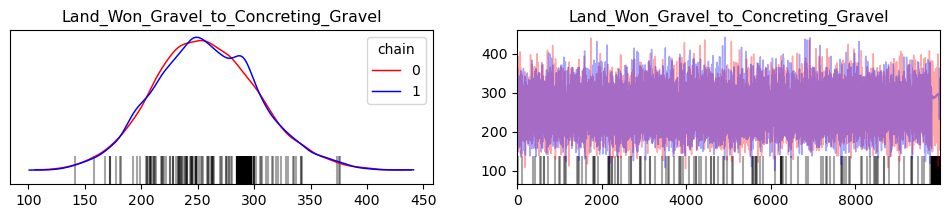

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


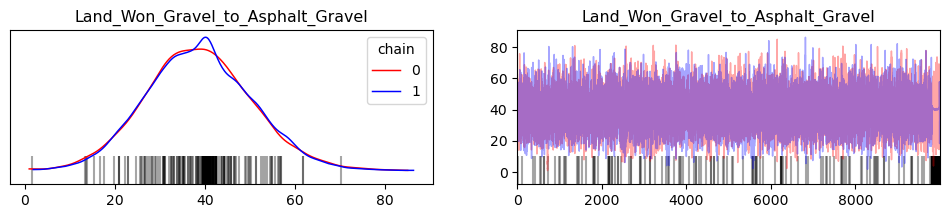

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


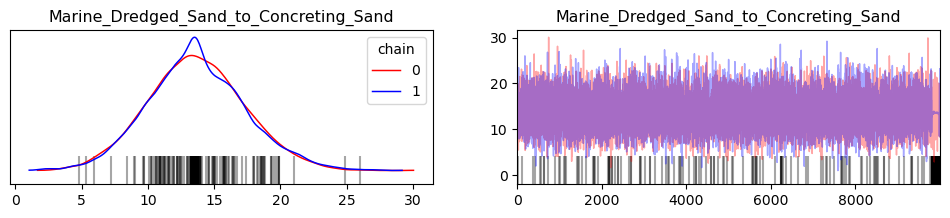

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


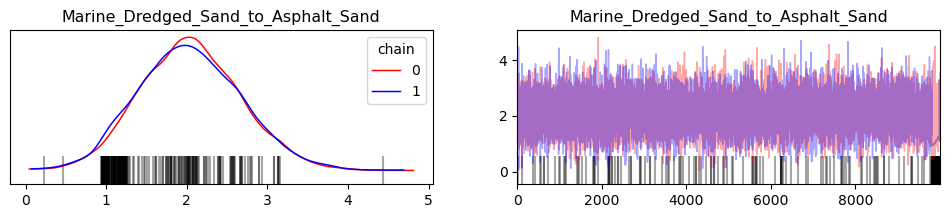

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


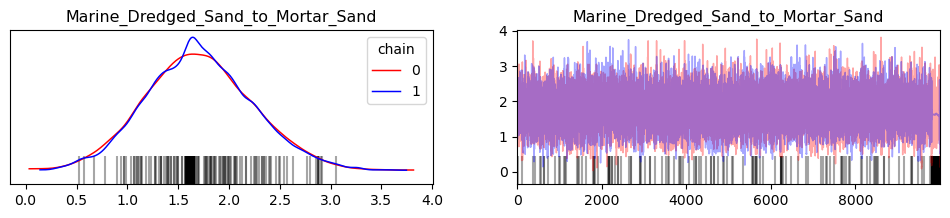

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


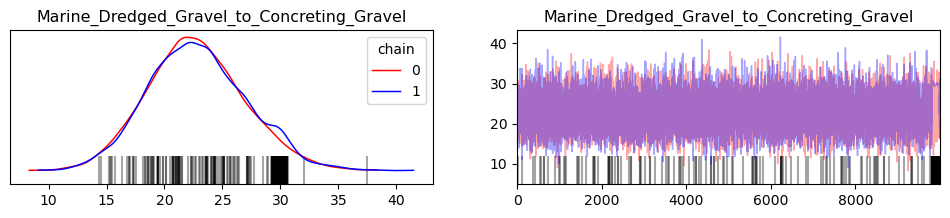

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


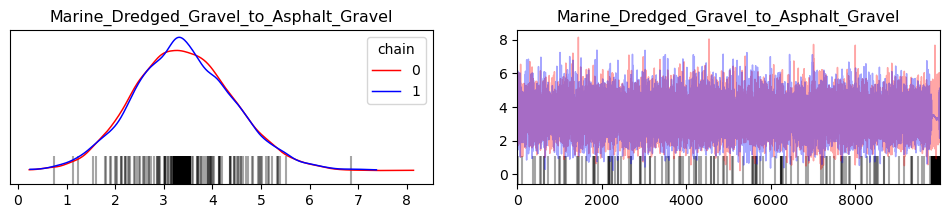

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


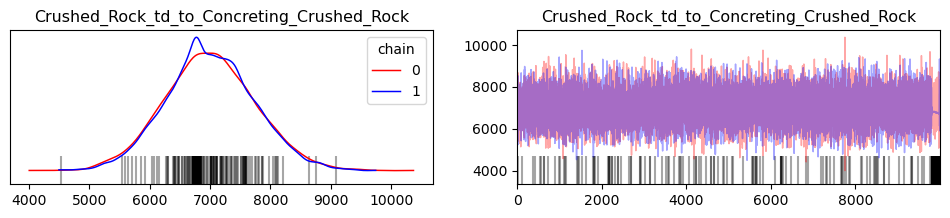

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


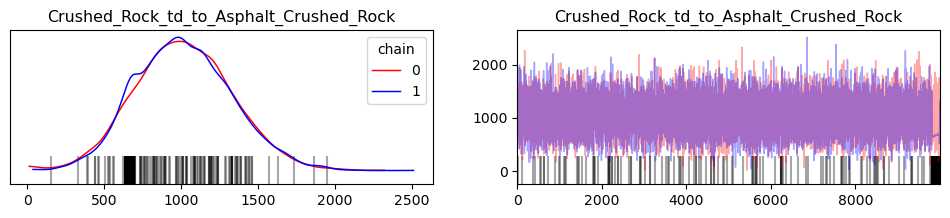

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


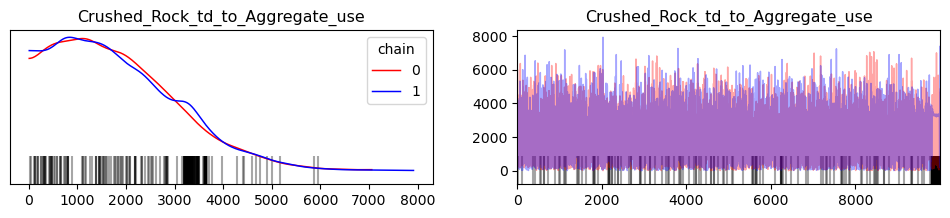

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


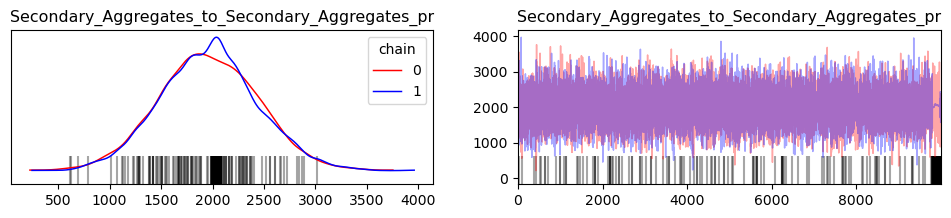

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


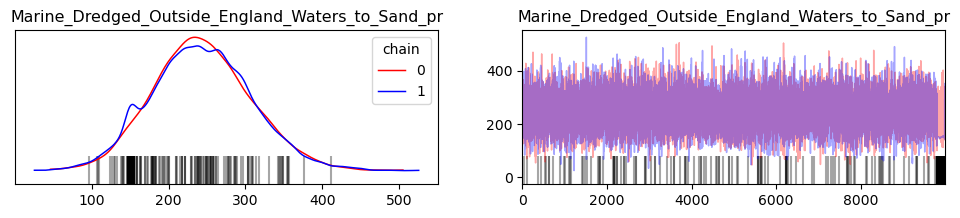

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


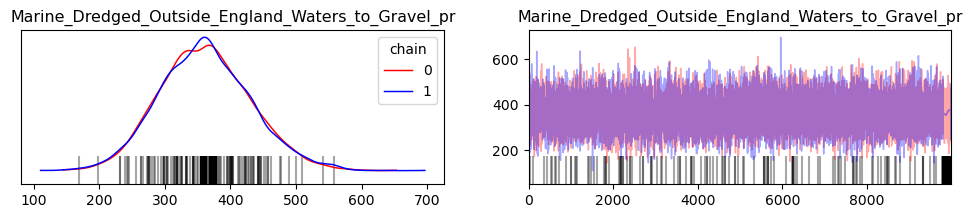

In [18]:
#generate traceplots for the flow variables

az.rcParams["plot.max_subplots"] = 400 #this increases the maximum plots displayed, default is 40.
#There are around 200 posterior flow plots so without this you only plot the first 40. 

plt.tight_layout()


for i in range(0, len(availablechildflows)):
    relevantrow=np.where(allflownumbersmatrix[:, 0] == str(availablechildflows[i]))
    relevantrow=relevantrow[0][0]
    flownumberfrom=allflownumbersmatrix[relevantrow, 1]
    flownumberto=allflownumbersmatrix[relevantrow, 2]
    
    labeller = azl.MapLabeller(var_name_map={"flows": processnamesdict[str(flownumberfrom)]+"_to_"+processnamesdict[str(flownumberto)]})
    posteriorflowtraceplots=az.plot_trace(trace, var_names="flows",compact=True,show=True,backend="matplotlib", coords={'flows_dim_0': [i]},labeller=labeller,legend=True,chain_prop={"color": ['r', 'b']})

    #posteriorflowtraceplots[0,0].get_figure().savefig("outputgraphstrace"+filelabeler(useratiodata)+"/"+"Flowtrace"+processnamesdict[str(flownumberfrom)]+"_to_"+processnamesdict[str(flownumberto)]+filelabeler(useratiodata)+".pdf")

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\arviz\plots\backends\matplotlib\__init__.py:55: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axes = subplots(rows, cols, **backend_kwargs)


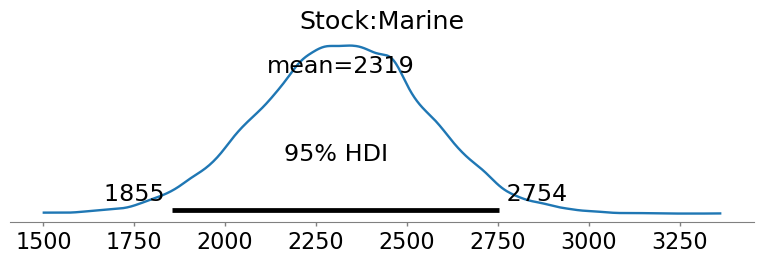

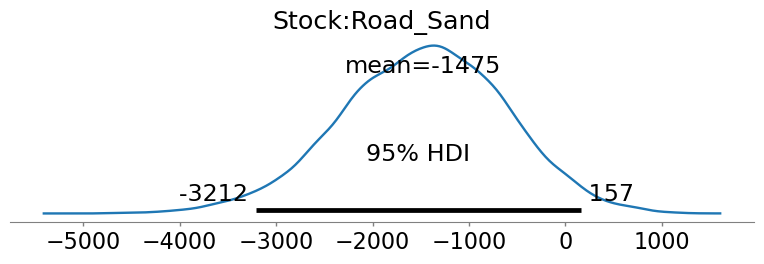

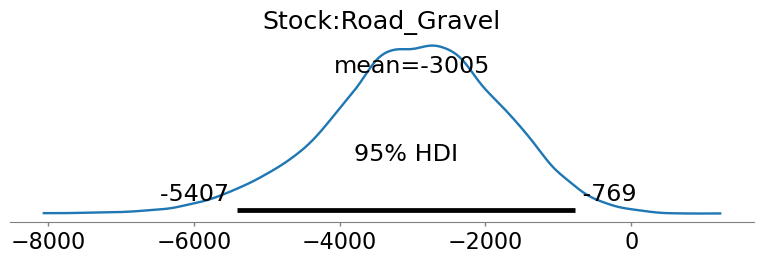

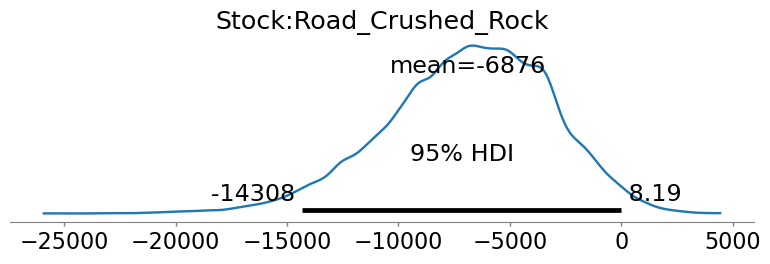

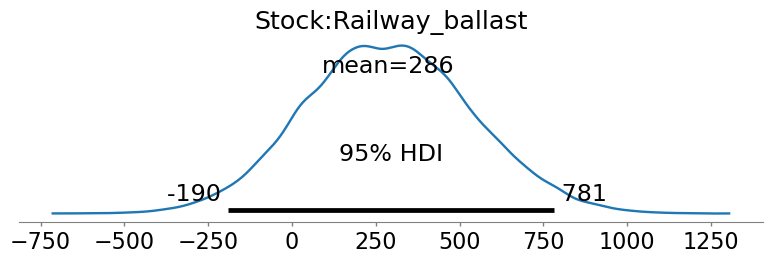

...

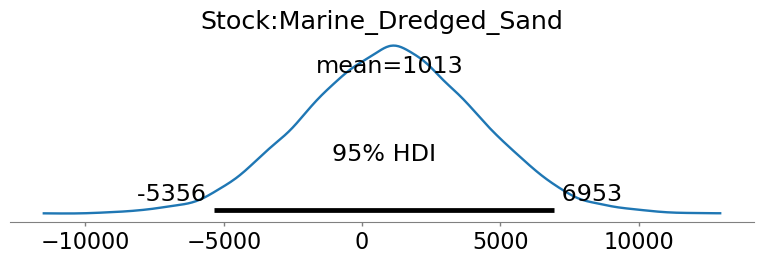

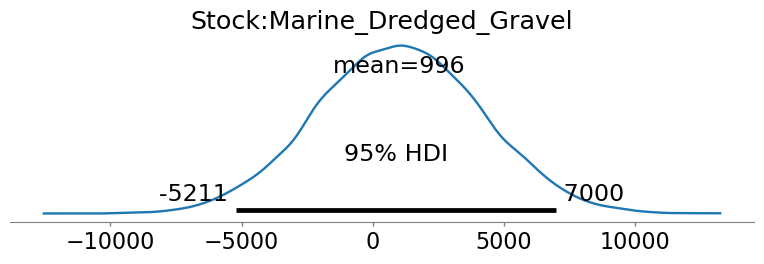

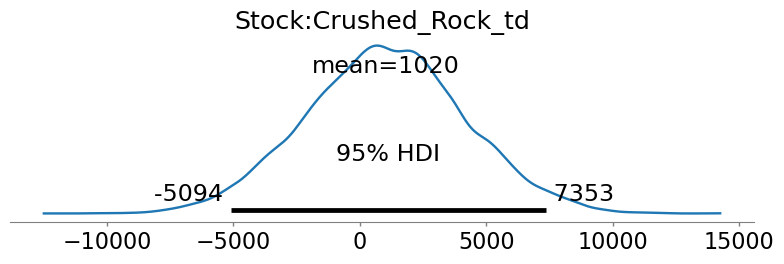

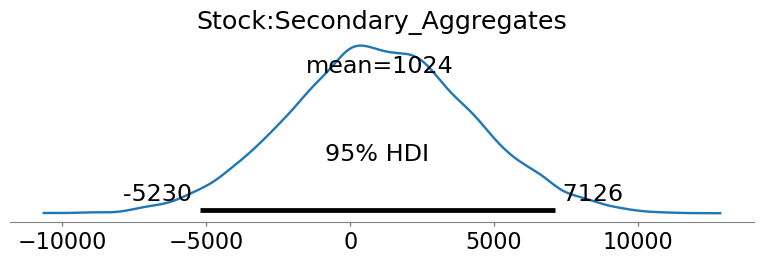

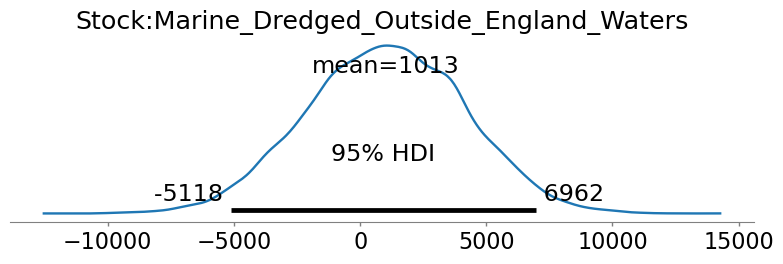

In [19]:
#plot marginal posterior distribution for change in stock variables

labels=[processnamesdict[str(x)] for x in availablechildstocks]

    
for i in range(0,len(labels)):
    posteriorstockplots=az.plot_posterior(trace, var_names="stocks",show=False,backend="matplotlib",round_to=3, hdi_prob=0.95,  coords={'stocks_dim_0': [i]}, textsize=16,figsize=[9.6, 2.4])
    posteriorstockplots.title.set_text("Stock"+":"+labels[i]) 
    #plt.axvline(x=truevalues[availablechildstocks][i], color="red")
    #posteriorstockplots.get_figure().savefig("outputgraphs"+filelabeler(useratiodata)+"/"+"Stock"+"_"+labels[i]+filelabeler(useratiodata)+".pdf")

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\arviz\plots\backends\matplotlib\__init__.py:55: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axes = subplots(rows, cols, **backend_kwargs)


FileNotFoundError: [Errno 2] No such file or directory: 'outputgraphsscenarioB/Recycled_Processing/Production_Waste_to_Crushed_Rock_tdscenarioB.pdf'

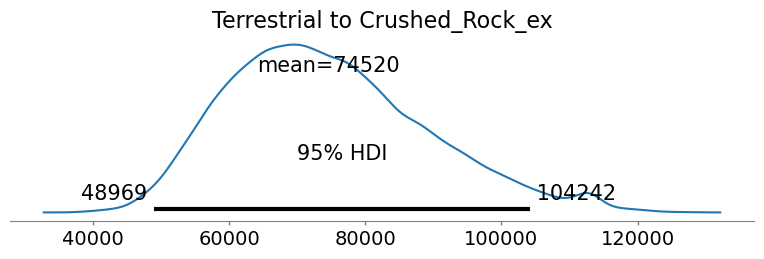

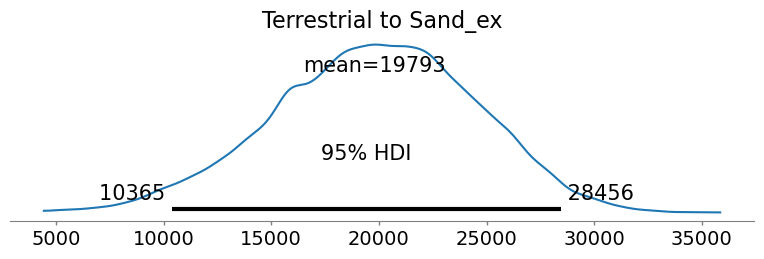

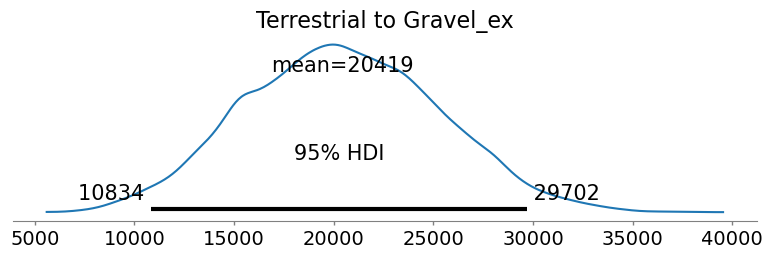

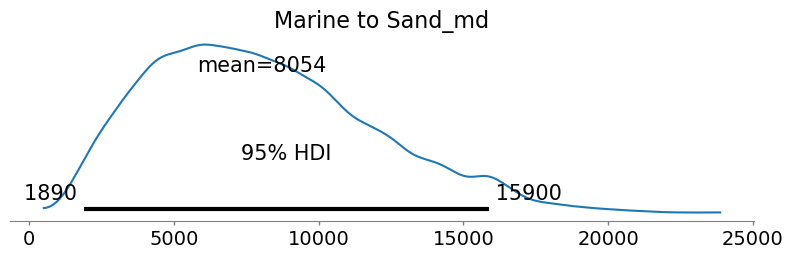

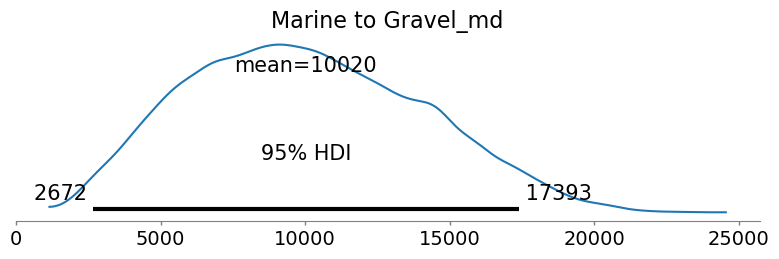

...

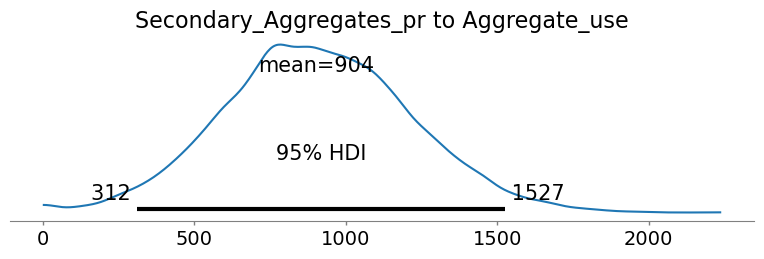

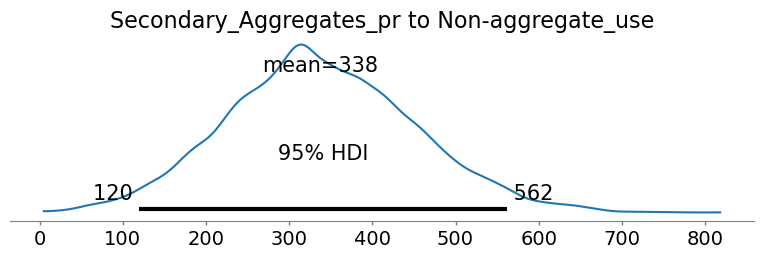

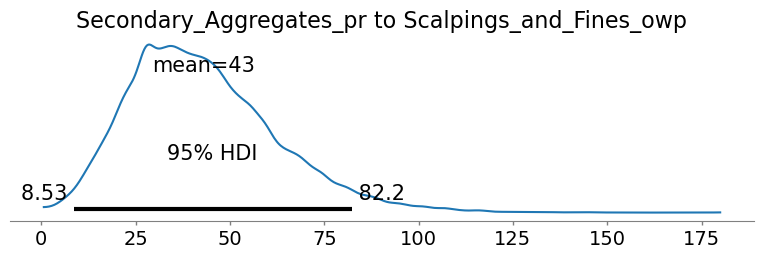

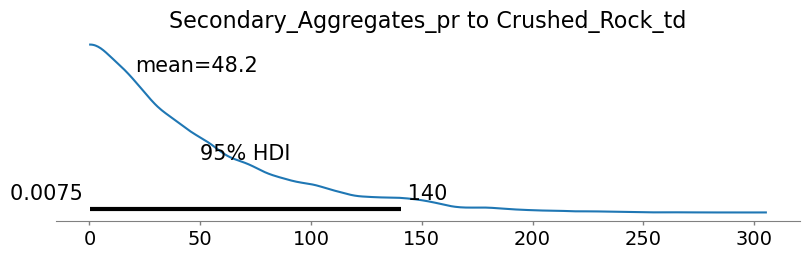

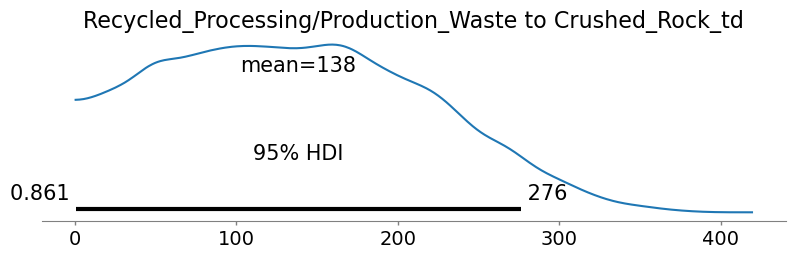

In [14]:
#plot marginal posterior distribution for flow variables
az.rcParams["plot.max_subplots"] = 400 #this increases the maximum plots displayed, default is 40.
#There are around 200 posterior flow plots so without this you only plot the first 40. 

for i in range(0, len(availablechildflows)):
    relevantrow=np.where(allflownumbersmatrix[:, 0] == str(availablechildflows[i]))
    relevantrow=relevantrow[0][0]
    flownumberfrom=allflownumbersmatrix[relevantrow, 1]
    flownumberto=allflownumbersmatrix[relevantrow, 2]
    posteriorflowplots=az.plot_posterior(trace, var_names="flows",show=False,backend="matplotlib", round_to=3, hdi_prob=0.95,coords={'flows_dim_0': [i]}, textsize=14, figsize=[9.6, 2.4])
    
   # plt.axvline(x=truevalues[availablechildflows][i], color="red")
    posteriorflowplots.title.set_text(processnamesdict[str(flownumberfrom)]+" to "+processnamesdict[str(flownumberto)])
    posteriorflowplots.get_figure().savefig("outputgraphs"+filelabeler(useratiodata)+"/"+processnamesdict[str(flownumberfrom)]+"_to_"+processnamesdict[str(flownumberto)]+filelabeler(useratiodata)+".pdf")


In [9]:
#posterior predictive samples

posterior_predpmy4=pm.sample_posterior_predictive(trace=trace, model=model, random_seed=123456)

Sampling: [CoM, flowdata, ratiodata, stockdata]


In [10]:
#before pymc4, pm.sample_posterior_predictive would output a dictionary of 
#stockdata, flowdata, CoM and each key contains as 'value' an array of NxP where N is the sample size 
#and P is the number of variables in that key

#After pymc4, it will output xarray dataset with the above 'keys' (such as stockdata), but the values are like
#(chain, draw, stockdata_dim_2) instead. So I feel like what you need to do is concatenate (vertically stack) two chains to make
#(draw, stockdata_dim_2) again, and put that into a dictionary.

#the below code transforms the posterior_pred back into the pymc3 format so the old ppplots function is compatible with it.

posterior_prededit=posterior_predpmy4['posterior_predictive']

print(posterior_prededit)

print('banana')

stockarray=np.vstack((np.array(posterior_prededit['stockdata'][0]),np.array(posterior_prededit['stockdata'][1])))

flowarray=np.vstack((np.array(posterior_prededit['flowdata'][0]),np.array(posterior_prededit['flowdata'][1])))

if useratiodata==1:
    ratioarray=np.vstack((np.array(posterior_prededit['ratiodata'][0]),np.array(posterior_prededit['ratiodata'][1])))

CoMarray=np.vstack((np.array(posterior_prededit['CoM'][0]),np.array(posterior_prededit['CoM'][1])))

#sanity check shape
print(np.shape(stockarray))
print(np.shape(flowarray))
print(np.shape(CoMarray))

if useratiodata==1:
    posterior_pred = {'stockdata': stockarray, 'flowdata': flowarray, 'ratiodata': ratioarray, 'CoM': CoMarray}
else:
    posterior_pred = {'stockdata': stockarray, 'flowdata': flowarray, 'CoM': CoMarray}


<xarray.Dataset>
Dimensions:          (chain: 2, draw: 10000, stockdata_dim_2: 1,
                      flowdata_dim_2: 18, ratiodata_dim_2: 81, CoM_dim_2: 40)
Coordinates:
  * chain            (chain) int32 0 1
  * draw             (draw) int32 0 1 2 3 4 5 ... 9994 9995 9996 9997 9998 9999
  * stockdata_dim_2  (stockdata_dim_2) int32 0
  * flowdata_dim_2   (flowdata_dim_2) int32 0 1 2 3 4 5 6 ... 12 13 14 15 16 17
  * ratiodata_dim_2  (ratiodata_dim_2) int32 0 1 2 3 4 5 6 ... 75 76 77 78 79 80
  * CoM_dim_2        (CoM_dim_2) int32 0 1 2 3 4 5 6 7 ... 33 34 35 36 37 38 39
Data variables:
    stockdata        (chain, draw, stockdata_dim_2) float64 2.226e+03 ... 1.7...
    flowdata         (chain, draw, flowdata_dim_2) float64 7.961e+03 ... 38.84
    ratiodata        (chain, draw, ratiodata_dim_2) float64 0.3907 ... 0.6839
    CoM              (chain, draw, CoM_dim_2) float64 -323.2 82.59 ... -552.8
Attributes:
    created_at:                 2024-06-21T11:47:50.081286
    arviz_version

In [22]:
print(posterior_pred['stockdata'][0])

print(posterior_pred['stockdata'][1])

print(np.array(posterior_pred['stockdata']).shape[0])

print(type(posterior_pred['stockdata']))

[2371.37758549]
[2803.98502055]
20000
<class 'numpy.ndarray'>


In [23]:
print(posterior_pred['flowdata'][0])

print(posterior_pred['flowdata'][1])

print(np.array(posterior_pred['flowdata']).shape[0])

print(type(posterior_pred['flowdata']))

[10752.54660219  2710.02396728  1494.50450065   510.71891045
  7667.19776027   308.77058341 17993.90653585   845.47629486
  3941.21987447 10830.86904965   239.55881184 11781.82219767
  4144.25284834 32814.17553798 12439.46090837    77.56064193
   490.82807317    48.53599725]
[ 5335.88407456  2775.66168986  2063.08516136   859.72250995
  7825.65320886   214.92977439 17085.45790984   690.50381518
  4027.84970653 13394.50770129   268.41664141 11161.78588247
  4300.26849676 23771.58793093 12711.65210068    98.97917532
   512.4365875     54.15856236]
20000
<class 'numpy.ndarray'>


In [11]:
import pickle

with open('posteriorpred'+filelabeler(useratiodata)+'.pkl', 'wb') as f:
    pickle.dump(posterior_pred, f)
        
#with open('posteriorpred'+filelabeler(useratiodata)+'.pkl', 'rb') as f:
    #posterior_pred = pickle.load(f)

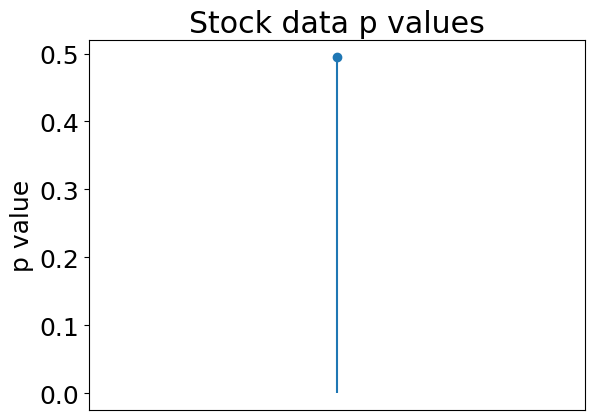

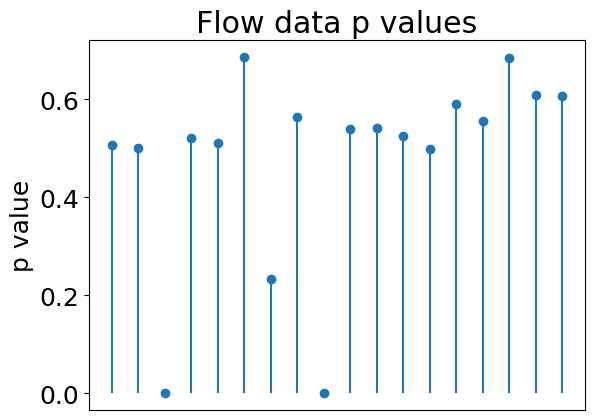

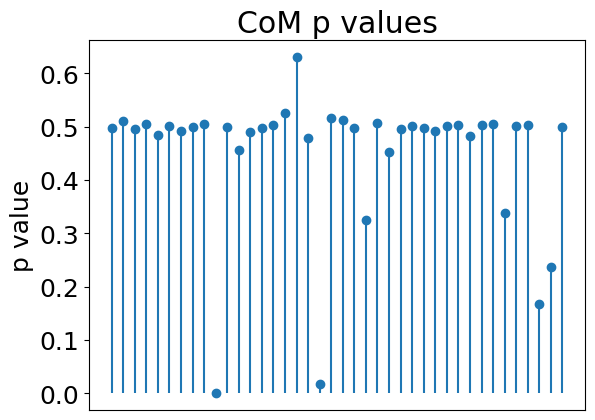

C:\Users\arm319\OneDrive - Imperial College London\BaMFA\Junyang\Paper2material (2)\Paper2material\code\posteriorpredictive.py:60: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions
  stock_hdi = az.hdi(posterior_pred['stockdata'], hdi_prob=0.95)
C:\Users\arm319\OneDrive - Imperial College London\BaMFA\Junyang\Paper2material (2)\Paper2material\code\posteriorpredictive.py:61: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions
  flow_hdi = az.hdi(posterior_pred['flowdata'], hdi_prob=0.95)
C:\Users\arm319\OneDrive - Imperial College London\BaMFA\Junyang\Paper2material (2)\Paper2material\code\posteriorpredictive.py:62: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions
  CoM

check stock data coverage
[[1.70246627e+03 2.97221326e+03 2.32500000e+03 1.00000000e+00]]
check flow data coverage
[[5.57013312e+03 9.67448356e+03 7.57300000e+03 1.00000000e+00]
 [2.08939300e+03 3.61999474e+03 2.86500000e+03 1.00000000e+00]
 [6.79219404e+02 2.52107665e+03 4.05000000e+03 0.00000000e+00]
 [4.40917090e+02 7.75382156e+02 6.00000000e+02 1.00000000e+00]
 [5.85309172e+03 1.01871162e+04 7.98100000e+03 1.00000000e+00]
 [2.78767379e+02 4.71440404e+02 3.52000000e+02 1.00000000e+00]
 [1.20829603e+04 2.20704322e+04 1.91070000e+04 1.00000000e+00]
 [5.37094919e+02 9.29668190e+02 7.11000000e+02 1.00000000e+00]
 [1.50081879e+03 4.15331276e+03 5.63200000e+03 0.00000000e+00]
 [8.54305683e+03 1.49178983e+04 1.15650000e+04 1.00000000e+00]
 [1.75433883e+02 3.04189693e+02 2.36000000e+02 1.00000000e+00]
 [8.69613020e+03 1.53019284e+04 1.18880000e+04 1.00000000e+00]
 [2.76112694e+03 4.81317150e+03 3.77100000e+03 1.00000000e+00]
 [2.26138245e+04 3.80648048e+04 2.91280000e+04 1.00000000e+00]
 [8

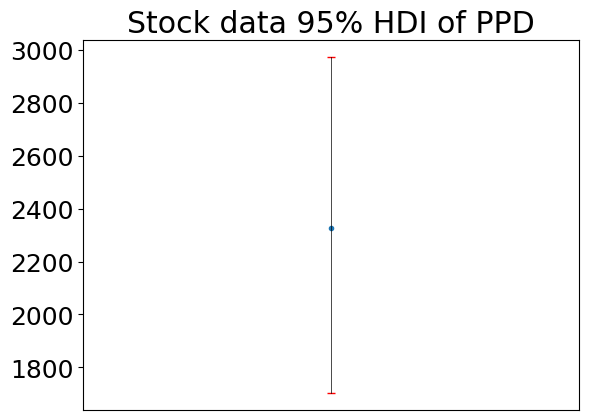

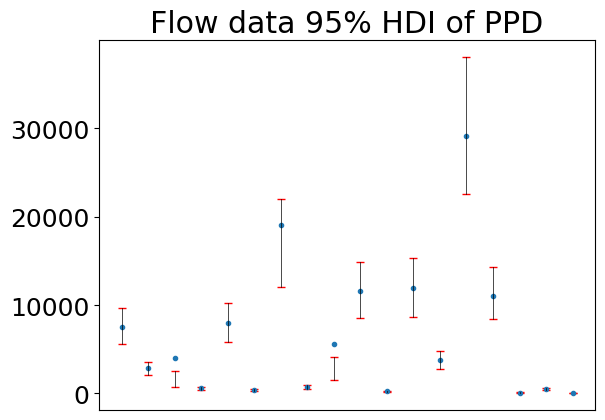

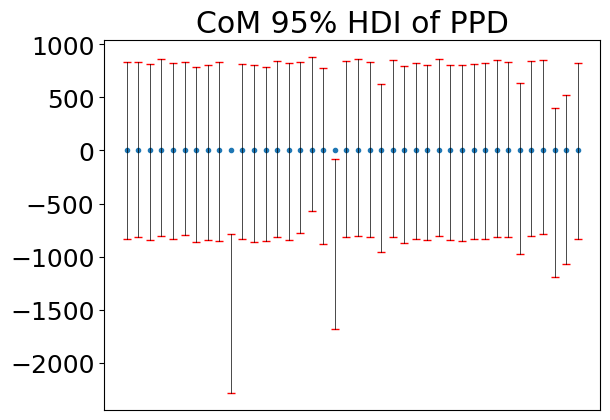

In [25]:
#plot posterior predictive 95% HDI and p values, for flow and change in stock data, and CoM conditions.

import os
directory = "outputgraphsscenarioB"
if not os.path.exists(directory):
    os.makedirs(directory)

ppplots(posterior_pred,datavector,stockindex,flowindex,CoMindex,useratiodata)

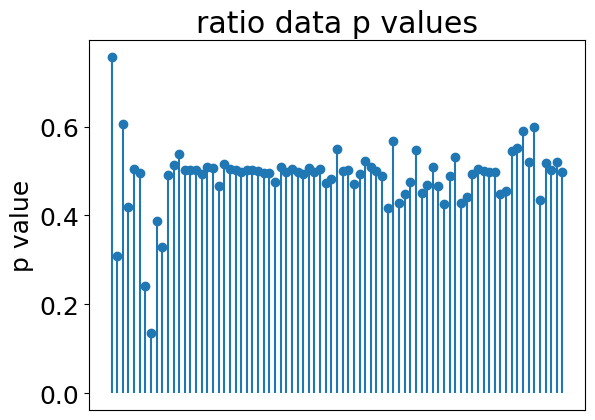

C:\Users\arm319\OneDrive - Imperial College London\BaMFA\Junyang\Paper2material (2)\Paper2material\code\posteriorpredictive.py:166: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions
  ratio_hdi = az.hdi(posterior_pred['ratiodata'], hdi_prob=0.95)


check ratio data coverage
[[ 2.30046870e-01  7.48712051e-01  4.00000000e-01  1.00000000e+00]
 [ 1.47769787e-01  8.80946243e-01  6.00000000e-01  1.00000000e+00]
 [ 1.38598277e-01  7.27825724e-01  4.00000000e-01  1.00000000e+00]
 [ 1.72717550e-01  9.60459030e-01  6.00000000e-01  1.00000000e+00]
 [ 1.07767134e-01  7.13026953e-01  4.00000000e-01  1.00000000e+00]
 [ 2.01133736e-01  1.01212275e+00  6.00000000e-01  1.00000000e+00]
 [-1.96528818e-02  4.27793802e-01  2.80000000e-01  1.00000000e+00]
 [-6.68333601e-02  5.55164821e-01  4.20000000e-01  1.00000000e+00]
 [ 6.25418836e-03  2.01481919e-01  1.20000000e-01  1.00000000e+00]
 [ 4.65660105e-04  2.91940052e-01  1.80000000e-01  1.00000000e+00]
 [ 2.65646262e-01  1.14457037e+00  7.10000000e-01  1.00000000e+00]
 [ 2.16424627e-03  5.75558028e-02  3.00000000e-02  1.00000000e+00]
 [ 6.86715960e-02  4.73684351e-01  2.60000000e-01  1.00000000e+00]
 [ 2.70893479e-01  1.15047632e+00  7.10000000e-01  1.00000000e+00]
 [ 3.76597346e-03  5.78529815e-02  3

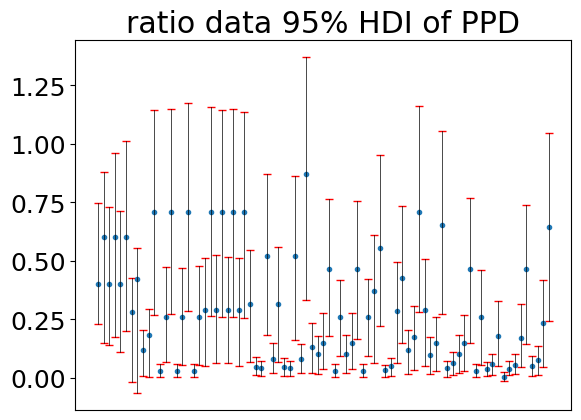

In [21]:
#plot posterior predictive 95% HDI and p values, for ratio data, scenario B only.

ppplotsratiodata(posterior_pred,ratiovector,useratiodata)

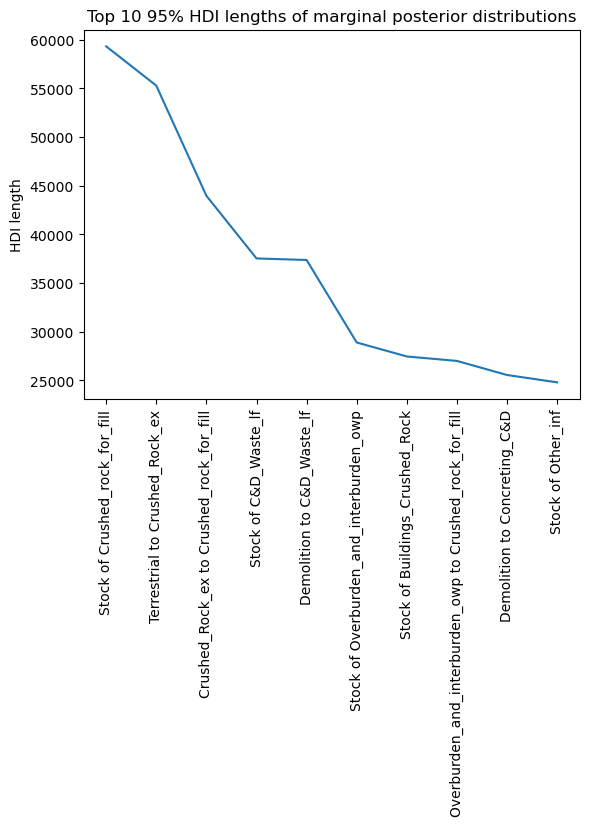

In [22]:
#plot top 10 widths of marginal posterior 95% HDI

ci_95_length=top10hdi(trace,processnamesdict,availablechildstocksandflows,useratiodata,m)

In [23]:
print(np.mean(ci_95_length))
print(np.max(ci_95_length))
print(np.min(ci_95_length))
print(np.shape(ci_95_length))


6298.051057716869
59308.29375227801
2.103599211743541
(165,)


In [24]:
print(trace)
print(len(trace))

Inference data with groups:
	> posterior
	> sample_stats
	> observed_data
3


In [25]:
trace.to_netcdf("model2"+filelabeler(useratiodata)+".nc")
#I had to add 1 after model to get it to save - cannot overwrite existing file and I am unable to delete...

'model2scenarioB.nc'

In [26]:
print("model2"+filelabeler(useratiodata)+".nc")
trace = az.from_netcdf("model2"+filelabeler(useratiodata)+".nc")
#I had to add 1 after model to get it to save - cannot overwrite existing file and I am unable to delete...

model2scenarioB.nc


In [27]:
import pandas as pd
import arviz as az

# Assuming 'trace' is your InferenceData object
trace_df = az.summary(trace).round(2).reset_index()
trace_df.to_csv('bayesian_results2.csv', index=False)


In [28]:
    for i in range(N):
        print(f"Variable {i + 1}: Mean = {priormean[i]}, SD = {np.sqrt(covariancevec[i])}")

    return priormean, covariancevec, truevalues

Variable 1: Mean = 1000.0, SD = 3162.2776601683795
Variable 2: Mean = 1000.0, SD = 3162.2776601683795
Variable 3: Mean = 1000.0, SD = 3162.2776601683795
Variable 4: Mean = 1000.0, SD = 3162.2776601683795
Variable 5: Mean = 1000.0, SD = 3162.2776601683795
Variable 6: Mean = 1000.0, SD = 3162.2776601683795
Variable 7: Mean = 1000.0, SD = 3162.2776601683795
Variable 8: Mean = 1000.0, SD = 3162.2776601683795
Variable 9: Mean = 1000.0, SD = 3162.2776601683795
Variable 10: Mean = 1000.0, SD = 3162.2776601683795
Variable 11: Mean = 1000.0, SD = 3162.2776601683795
Variable 12: Mean = 1000.0, SD = 3162.2776601683795
Variable 13: Mean = 1000.0, SD = 3162.2776601683795
Variable 14: Mean = 1000.0, SD = 3162.2776601683795
Variable 15: Mean = 1000.0, SD = 3162.2776601683795
Variable 16: Mean = 1000.0, SD = 3162.2776601683795
Variable 17: Mean = 1000.0, SD = 3162.2776601683795
Variable 18: Mean = 1000.0, SD = 3162.2776601683795
Variable 19: Mean = 1000.0, SD = 3162.2776601683795
Variable 20: Mean = 1

SyntaxError: 'return' outside function (2848074330.py, line 4)

In [30]:
trace = az.from_netcdf("model2" + filelabeler(useratiodata) + ".nc")

In [12]:
output=az.summary(trace).round(9)

In [13]:
output

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
stocks[0],2319.989,234.925,1869.614,2759.042,1.526,1.123,23875.0,5935.0,1.0
stocks[1],-1488.427,875.933,-3168.108,117.776,9.799,6.930,7899.0,10625.0,1.0
stocks[2],-3004.769,1207.674,-5367.035,-842.756,14.473,10.234,6901.0,8901.0,1.0
stocks[3],-6959.563,3745.455,-13827.899,51.411,45.109,31.899,6725.0,10192.0,1.0
stocks[4],285.294,250.085,-175.477,759.672,1.505,1.310,27523.0,14421.0,1.0
...,...,...,...,...,...,...,...,...,...
datavars[54],0.358,299.011,-565.314,550.614,2.132,1.815,19670.0,16627.0,1.0
datavars[55],-0.334,293.782,-556.463,544.141,1.856,1.882,25042.0,17324.0,1.0
datavars[56],-401.704,275.962,-934.777,107.413,1.742,1.308,25103.0,18866.0,1.0
datavars[57],-296.811,284.649,-818.966,260.801,1.777,1.524,25620.0,14482.0,1.0


In [14]:
output=az.summary(trace).round(9)
output_flownav = pd.DataFrame(columns=['flownumberfrom', 'flownumberto'])  # Define the columns explicitly
for i in range(0, len(availablechildflows)):
    relevantrow = np.where(allflownumbersmatrix[:, 0] == str(availablechildflows[i]))
    relevantrow = relevantrow[0][0]
    flownumberfrom = allflownumbersmatrix[relevantrow, 1]
    flownumberto = allflownumbersmatrix[relevantrow, 2]
 
    # Add the values to the DataFrame using loc
    output_flownav.loc[len(output_flownav)] = [flownumberfrom, flownumberto]


In [35]:
output_flownav

,flownumberfrom,flownumberto
0,0,2
1,0,3
2,0,4
3,1,5
4,1,6
...,...,...
133,46,19
134,46,32
135,47,10
136,48,7


In [15]:
# Create a DataFrame with two zero-filled columns
output_stocknav = pd.DataFrame({'flownumberfrom': [0] * len(availablechildstocks),
                   'flownumberto': [0] * len(availablechildstocks)})
 
# Create a DataFrame with two zero-filled columns
output_parentnav = pd.DataFrame({'parentflownumberfrom': [0] * len(availablechildstocks+availablechildflows),
                   'parentflownumberto': [0] * len(availablechildstocks+availablechildflows)})
 
output_fsnav = pd.concat([output_stocknav, output_flownav], ignore_index=True)
output_nav = pd.concat([output_parentnav, output_fsnav], axis=1)
output_nav['navigation'] = output_nav['flownumberfrom'].astype(str) + '-' + output_nav['flownumberto'].astype(str)+ '-' + output_nav['parentflownumberfrom'].astype(str) + '-' + output_nav['parentflownumberto'].astype(str)
 
output['flownumberfrom'] = np.nan
output['flownumberto'] = np.nan
output['parentflownumberfrom'] = np.nan
output['parentflownumberto'] = np.nan
output['navigation'] = np.nan
 
output['flownumberfrom'].iloc[:len(output_nav)] = output_nav['flownumberfrom'].astype(str).values
output['flownumberto'].iloc[:len(output_nav)] = output_nav['flownumberto'].astype(str).values
output['parentflownumberfrom'].iloc[:len(output_nav)] = output_nav['parentflownumberfrom'].astype(str).values
output['parentflownumberto'].iloc[:len(output_nav)] = output_nav['parentflownumberto'].astype(str).values
output['navigation'].iloc[:len(output_nav)] = output_nav['navigation'].astype(str).values
 
original_columns = output.columns.tolist()
columns_to_move = ['flownumberfrom', 'flownumberto', 'parentflownumberfrom', 'parentflownumberto', 'navigation']
original_columns = [col for col in original_columns if col not in columns_to_move]
# Define the new column order
new_column_order = columns_to_move + original_columns
# Reorder the columns in the DataFrame
output = output[new_column_order]

C:\Users\arm319\AppData\Local\Temp\ipykernel_25396\2193368162.py:19: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '['0' '0' '0' '0' '0' '0' '0' '0' '0' '0' '0' '0' '0' '0' '0' '0' '0' '0'
 '0' '0' '0' '0' '0' '0' '0' '0' '0' '0' '0' '0' '1' '1' '2' '2' '2' '3'
 '3' '3' '4' '4' '4' '5' '5' '5' '6' '6' '6' '7' '7' '7' '7' '7' '7' '7'
 '7' '7' '7' '7' '7' '8' '8' '8' '8' '8' '8' '8' '8' '8' '8' '8' '9' '9'
 '9' '9' '9' '9' '9' '9' '10' '10' '10' '10' '10' '10' '10' '11' '12' '12'
 '12' '12' '12' '12' '12' '12' '12' '12' '12' '12' '12' '12' '12' '13'
 '13' '13' '13' '14' '14' '14' '14' '15' '15' '15' '15' '16' '16' '16'
 '16' '17' '17' '17' '18' '18' '18' '19' '19' '19' '20' '20' '20' '21'
 '22' '23' '24' '25' '25' '26' '26' '27' '27' '28' '28' '35' '35' '35'
 '36' '40' '41' '41' '41' '42' '42' '42' '43' '43' '44' '44' '44' '45'
 '45' '46' '46' '46' '47' '48' '48']' has dtype incompatible with float64, please explicitl

In [16]:
output

,flownumberfrom,flownumberto,parentflownumberfrom,parentflownumberto,navigation,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
stocks[0],0,0,0,0,0-0-0-0,2319.989,234.925,1869.614,2759.042,1.526,1.123,23875.0,5935.0,1.0
stocks[1],0,0,0,0,0-0-0-0,-1488.427,875.933,-3168.108,117.776,9.799,6.930,7899.0,10625.0,1.0
stocks[2],0,0,0,0,0-0-0-0,-3004.769,1207.674,-5367.035,-842.756,14.473,10.234,6901.0,8901.0,1.0
stocks[3],0,0,0,0,0-0-0-0,-6959.563,3745.455,-13827.899,51.411,45.109,31.899,6725.0,10192.0,1.0
stocks[4],0,0,0,0,0-0-0-0,285.294,250.085,-175.477,759.672,1.505,1.310,27523.0,14421.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
datavars[54],NaN,NaN,NaN,NaN,NaN,0.358,299.011,-565.314,550.614,2.132,1.815,19670.0,16627.0,1.0
datavars[55],NaN,NaN,NaN,NaN,NaN,-0.334,293.782,-556.463,544.141,1.856,1.882,25042.0,17324.0,1.0
datavars[56],NaN,NaN,NaN,NaN,NaN,-401.704,275.962,-934.777,107.413,1.742,1.308,25103.0,18866.0,1.0
datavars[57],NaN,NaN,NaN,NaN,NaN,-296.811,284.649,-818.966,260.801,1.777,1.524,25620.0,14482.0,1.0


In [17]:
output.to_csv('output_June.csv', index=False)

In [26]:
import numpy as np

# Extract results
likelihood_samples = trace['likelihood']  # Assuming likelihood is a parameter you're interested in

# Compute statistics
likelihood_mean = np.mean(likelihood_samples)
likelihood_distribution = az.plot_posterior(trace, var_names=['likelihood'], kind='hist')  # Assuming you want to visualize the distribution

# Output data
print("Likelihood mean:", likelihood_mean)
plt.show()  # Show the likelihood distribution plot

KeyError: 'likelihood'

In [27]:
print(posterior_pred['flowdata'])
print("Shape of posterior_pred['flowdata']: ", posterior_pred['flowdata'].shape)


IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)

